# Galactic Log SED Fitting

## Ben Hanson

### Import Modules

In [1]:
import h5py
import os
os.environ['SPS_HOME'] = '/home/benjamin.hanson/UF REU/SED-Fitting/UF-REU-PROJECT'
import fsps
%matplotlib inline
import math
import matplotlib.pyplot as plt
import csv
import numpy as np
import scipy.odr.odrpack as odrpack
import math
import scipy as scipy
from scipy import optimize
from scipy import interp
from scipy import integrate
from matplotlib.ticker import AutoMinorLocator
from matplotlib import gridspec
import matplotlib.ticker as ticker
from scipy.interpolate import RegularGridInterpolator
from scipy.stats import norm
import sys
from importlib import reload
from rbvfit import model as m
from datetime import date
reload(m)

import emcee
import corner
import scipy.optimize as op

width = 30

from multiprocessing import cpu_count
from multiprocessing import Pool
import random
from IPython.display import clear_output

### Prospector Modules ###
import time
import sedpy
import prospect
import dynesty
from prospect.fitting import fit_model
from prospect.models import priors, transforms #helper functions for specifying priors
from prospect.models import sedmodel
from prospect.sources import FastStepBasis
from prospect.io import write_results as writer
from prospect.fitting import fit_model
from corner import quantile
from prospect.io import read_results as pread
import prospect.io.read_results as reader
import astropy.units as u
import astropy.constants as constants

### Define Functions

In [19]:
def creating_array(metallicity_array, age_array):
    
    mass_array = []
    
    print("Deleting previous iterations of spectrums...")
    # Deleting previous iteration of spectrum
    if 'sp' in locals():
        del sp
    
    rows = len(metallicity_array)
    columns = len(age_array)
    with open('stellar_bank_{}x{}.csv'.format(str(int(rows)), str(int(columns))), 'w') as f:
        write = csv.writer(f)
        print("Creating new array...")
        # Creating Array
        
        sp = fsps.StellarPopulation(compute_vega_mags=False, zcontinuous=1, sfh=0, logzsol = 0, dust_type=2, dust2=0.0)
       
        for i in range(len(metallicity_array)):
            
            metallicity = metallicity_array[i]
            sp.params['logzsol'] = metallicity
                        
            for j in range(len(age_array)):
                
                age = age_array[j]
                wave, spec = sp.get_spectrum(tage = age)
                mass_array.append(str(sp.stellar_mass))
                spec = list(spec)
                spec = list(map(str, spec))
                write.writerow(spec)   
    
    print("Spectrum array complete. Writing Mass Array.")
    with open('stellar_bank_{}x{}_mass.csv'.format(str(int(rows)), str(int(columns))), 'w') as f:
        write = csv.writer(f)
        
        for i in range(len(mass_array)):
            
            value = mass_array[i]
            write.writerow([value])
            
    print("Mass Array Complete")    
        
def reading_csv(file_name, rows, columns):
    
    print("Reading array...")
    new_array = []
    with open(file_name) as csv_file:
        csv_reader = csv.reader(csv_file, delimiter=',')
        for row in csv_reader:
            new_array.append(row)
    
    print("Unflattening array...")
    # Unflattening Array
    uf_array = []
    uf_sub_array = []

    r = rows
    c = columns
    iterator = 0

    for i in range(r):
        for j in range(c):
            new_array[iterator] = list(map(float, new_array[iterator]))
            uf_sub_array.append(new_array[iterator])
            iterator += 1
        uf_array.append(uf_sub_array)
        uf_sub_array = []
    
    return uf_array

def make_spectrum(age, metallicity):
    sp = fsps.StellarPopulation(compute_vega_mags=False, zcontinuous=1, sfh=0, logzsol= metallicity, dust_type=2, dust2=0.0)
    wave, spec = sp.get_spectrum(tage = age)
    del sp
    
    return wave, spec
    
def chi_sq_func(obs_Spec, exp_Spec):
    chiSq = 0
    for i in range(len(obs_Spec)):
        chiSq += ((obs_Spec[i] - exp_Spec[i])**2)/exp_Spec[i]
        
    return chiSq

def plt_spectra(wave, spec, theta):
    plt.loglog(wave, spec, label = "Params: logZ = {}, Age (Gyr) = {}".format(theta[0], theta[1]))

def model_guess(beta,input_wave):
    
    spec = interpolating_spec(beta)[0]
    
    if (len(spec) != len(input_wave)):
        trunc_spec = np.interp(input_wave, wave, spec)
        spec = trunc_spec    

    return spec
    
def make_corner_plots(sampler):
          
    samples=sampler.chain[:, 100:, :].reshape((-1, ndim))#sampler.flatchain
    st=np.median(samples,axis=0)#np.median(sampler.flatchain, axis=0)
    figure=corner.corner(samples, labels=text_label, truths=st)
    theta_prime=st

    value1 =np.percentile(samples,32,axis=0)
    value2 = np.percentile(samples,68,axis=0)    
    axes = np.array(figure.axes).reshape((ndim, ndim))

    # Loop over the diagonal
    for i in range(ndim):
        ax = axes[i, i]
        ax.axvline(value1[i], color="aqua")
        ax.axvline(value2[i], color="aqua")

    # Loop over the histograms
    for yi in range(ndim):
        for xi in range(yi):
            ax = axes[yi, xi]
            ax.axvline(value1[xi],color="aqua")
            ax.axvline(value2[xi],color="aqua")
            #ax.axhline(value1[yi], color="g")
            #ax.axhline(value2[yi], color="r")
            #ax.plot(value1[xi], value1[yi], "sg")
            #ax.plot(value2[xi], value2[yi], "sr")

def build_weight_array(weight_array, row_array, column_array, weight_added_array):
    for i in range(len(row_array)):
        weight_array[row_array[i]][column_array[i]] += weight_added_array[i]
    return weight_array    

def generate_random_weight_array(lb, ub, metallicity_array, age_array):

    s = np.random.normal(1, 0.1, 10000)
    count, bins = np.histogram(s, len(age_array))
    prob = count / sum(count)
    count, bins, ignored = plt.hist(bins[:-1], bins, weights=prob)
    plt.clf()
    count = list(count)
    max_value = max(count)
    max_index = count.index(max_value)
    count = np.array(count)
    count = count * ((ub + lb)/2)/(count[max_index])
    count_upper = count * 1.05
    count_lower = count * 0.95

    s2 = np.random.normal(1, 0.1, 100)
    count2, bins2 = np.histogram(s2, len(metallicity_array))
    prob2 = count2 / sum(count2)
    count2, bins2, ignored2 = plt.hist(bins2[:-1], bins2, weights=prob2)
    plt.clf()
    count2 = list(count2)
    max_value2 = max(count2)
    max_index2 = count2.index(max_value2)
    count2 = np.array(count2)
    weights = count2 * 1/(count2[max_index2])

    upper_bounds = []
    lower_bounds = []

    for i in range(len(count2)):
        count_upper_new = count_upper * weights[i]
        count_lower_new = count_lower * weights[i]

        for j in range(len(count_upper_new)):
            upper_bounds.append(count_upper_new[j])
            lower_bounds.append(count_lower_new[j])

    weight_array = []

    for k in range(len(upper_bounds)):

        weight = random.uniform(lower_bounds[k], upper_bounds[k])
        weight_array.append(weight)

    weight_array = np.array(weight_array)
    weight_array = np.reshape(weight_array, (len(metallicity_array), len(age_array)))

    return weight_array, np.array(lower_bounds), np.array(upper_bounds)
                      
def galactic_spec(weight_array):
    
    row_array, column_array = convert_weight_array(weight_array, metallicity_space, age_space)
    met_array, age_array = convert_arrays(row_array, column_array, metallicity_space, age_space)
    weight_array = weight_array.flatten()

    total_spec = np.zeros(5994)

    for i in range(len(met_array)):
        met = np.array([met_array[i]])
        age = np.array([age_array[i]])

        theta = np.concatenate((met, age))
        spec = interpolating_spec(theta)[0]
        total_spec += (spec * weight_array[i])
    
    return total_spec

def prospector_galactic_spec(weight_array, age_space, metallicity):
    
    weight_array = weight_array.flatten()

    total_spec = np.zeros(5994)
    met = np.array([metallicity])
    for i in range(len(weight_array)):
        age = np.array([age_space[i]])

        theta = np.concatenate((met, age))
        spec = interpolating_spec(theta)[0]
        total_spec += (spec * weight_array[i])
    
    return total_spec

def galactic_model_guess(weight_array, input_wave):
    
    total_spec = galactic_spec(weight_array)
    
    if (len(total_spec) != len(input_wave)):
        trunc_spec = np.interp(input_wave, wave, total_spec)
        total_spec = trunc_spec        
    
    return total_spec

def prospector_galactic_model_guess(weight_array, input_wave, age_space, metallicity):
    
    total_spec = prospector_galactic_spec(weight_array, age_space, metallicity)
    
    if (len(total_spec) != len(input_wave)):
        trunc_spec = np.interp(input_wave, wave, total_spec)
        total_spec = trunc_spec        
    
    return total_spec

def print_and_plot_results(sampler, wave, spec, title, galaxy, model):
    
    samples=sampler.chain[:, np.rint(no_of_steps/5).astype(np.int):, :].reshape((-1, ndim))#sampler.flatchain
    st=np.median(samples,axis=0)#np.median(sampler.flatchain, axis=0)
    theta_prime=st[:]
    
    print("Derived values are (weight array): \n {}".format(theta_prime))   
    best_fit = model(theta_prime, wave)

    fig= plt.figure(figsize=(12,8))
    
    plt.loglog(wave, spec, ls = 'dotted', label= galaxy) 
    plt.title(title, fontsize = 20)
    plt.ylabel('Intensity (Solar luminosity/Hz)', fontsize = 18) # Labeling the x-axis
    plt.xlabel('Wavelength (Angstroms)', fontsize = 18) # Labeling the y-axis
    plt.xticks(fontsize = 16)
    plt.yticks(fontsize = 16)
    plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1, prop={'size': 15})
    
    return best_fit, theta_prime

def convert_arrays(row_array, column_array, metallicity_space, age_space):
    
    met_array = []
    age_array = []
    
    for i in range(len(row_array)):
        met_array.append(metallicity_space[row_array[i]])
        age_array.append(round(age_space[column_array[i]], 4))
        
    return met_array, age_array

def convert_weight_array(weight_array, metallicity_space, age_space):
    
    row_array = []
    column_array = []
    weight_array = np.reshape(weight_array, (len(metallicity_space), len(age_space)))
    
    for i in range(len(weight_array)):
        for j in range(len(weight_array[0])):
            if (weight_array[i][j] != 0):
                row_array.append(i)
                column_array.append(j)
                
    return row_array, column_array

######## Computing Likelihoods######
def lnprior(theta, lb, ub):
    for index in range(0, len(lb)):
        if (lb[index] > theta[index]) or (ub[index] < theta[index]):
            return -np.inf
    return 0.0

def lnlike(theta, model, x, y, yerr):
    model_y = model(theta, x)
    model_y = np.log10(model_y)
    y = np.log10(y)
    yerr = y * 0.01
    inv_sigma2 = 1.0/(yerr**2)
    all_c2_values = (y - model_y) ** 2 * inv_sigma2  - np.log10(inv_sigma2)
    return -0.5 * (np.sum( all_c2_values  )) 

def lnprob(theta, lb, ub, model, x, y, yerr):
    lp = lnprior(theta, lb, ub)
    if not np.isfinite(lp):
        return -np.inf
    return lp + lnlike(theta, model, x, y, yerr)

def optimize_guess(model, theta, lb, ub, x, y, yerr):
    nll = lambda *args: -lnprob(*args)
    result = op.minimize(nll, [theta], args=(lb, ub, model, x, y, yerr))
    p = result["x"]
    return p

def galsedatlas_read_spectral_data(filename):
    rest_wave = []
    flux = []
    obs_wave = []
    source = []
    iterator = 0
    with open(filename, 'r') as f:
        for line in f:
            if (line[0] != '#'):
                line = line.split()
                for item in line:
                    if((item != " ") or (item != "\n")):
                        if (iterator % 4 == 0):
                            rest_wave.append(float(item))
                        elif (iterator % 4 == 1):
                            flux.append(float(item))
                        elif (iterator % 4 == 2):
                            obs_wave.append(float(item))
                        else:
                            source.append(float(item))

                        iterator += 1

    rest_wave = np.array(rest_wave)
    flux = np.array(flux)
    flux *= (rest_wave ** 2)
    obs_wave = np.array(obs_wave)
    source = np.array(source)
    return np.array(rest_wave), np.array(flux), np.array(obs_wave), np.array(source)

def add_to_bank(filename, description, array):
    array = list(array)
    array.insert(0, description)
    
    with open(filename, 'a') as f:
        write = csv.writer(f)
        write.writerow(array)
        
def read_through_bank(filename, description):
    try_again = True
    array = []
    while try_again == True:
        with open(filename) as csv_file:
            csv_reader = csv.reader(csv_file, delimiter=',')
            for row in csv_reader:
                if row[0] == description:
                    array = row
                    try_again = False
        if (try_again == True):
            print("Description not found. Input new description")
            description = str(input())
        if (description == "Exit"):
            print("Exiting")
            return array
        
    array.pop(0)
    array = [float(i) for i in array]
    return array

def mass_to_light_calc(input_weight_array, input_spec, input_wave):
    
    mass_light_ratio = 0
    total_luminosity = 0
    
    c = 2.997E18
    frequency = c / input_wave
    frequency = np.flip(frequency)
    input_spec = np.flip(input_spec)

    total_luminosity = np.trapz(input_spec,frequency)              
    
    row_array, column_array = convert_weight_array(input_weight_array, metallicity_space, age_space)
    met_array, age_array = convert_arrays(row_array, column_array, metallicity_space, age_space)
    input_weight_array = input_weight_array.flatten()

    total_mass = 0

    for i in range(len(met_array)):
        met = np.array([met_array[i]])
        age = np.array([age_array[i]])

        theta = np.concatenate((met, age))
        mass = interpolating_mass(theta)[0][0]
        total_mass += (input_weight_array[i] * mass)
        
    mass_light_ratio = total_mass / total_luminosity
    
    return mass_light_ratio

def prospector_mass_to_light_calc(input_weight_array, input_spec, input_wave, age_space, metallicity):
    
    mass_light_ratio = 0
    total_luminosity = 0
    
    c = 3E18
    frequency = c / input_wave
    frequency = np.flip(frequency)
    input_spec = np.flip(input_spec)

    total_luminosity = np.trapz(input_spec,frequency)              
    
    input_weight_array = input_weight_array.flatten()

    total_mass = 0
    met = np.array([metallicity])
    for i in range(len(input_weight_array)):
        age = np.array([age_space[i]])

        theta = np.concatenate((met, age))
        mass = interpolating_mass(theta)[0][0]
        total_mass += (input_weight_array[i] * mass)
        
    mass_light_ratio = total_mass / total_luminosity
    
    return mass_light_ratio

def get_uncertainty(sampler):
    
    sampler_ = np.array( sampler.chain )
    sub_array = []
    position_array = []
    chain_length = len(sampler_[0])
    for i in range(len(sampler_)):
        for j in range(len(sampler_[0][0])):           
            sub_array.append(sampler_[i][chain_length-1][j])
        position_array.append(sub_array)
        sub_array = []

    position_array = np.array(position_array)

    distributions = []
    sub_array = []
    
    for i in range(len(position_array[0])):
        for j in range(len(position_array)):
            sub_array.append(position_array[j][i])

        distributions.append(sub_array)
        sub_array = []

    distributions = np.array(distributions)
    
    unc = []
    
    for i in range(len(distributions)):
        unc.append(distributions[i].std())
        
    return unc     

def interpolating_spec_model(theta, x):
    spec = setting_min(interpolating_spec(theta)[0])
    
    return spec

def clear_csv(filename):
    f = open(filename, "w+")
    f.close()
    
def mass_light_pdf(sampler, sample_size, input_spec, input_wave, best_fit):
    
    sampler_ = np.array( sampler.chain )
    sub_array = []
    position_array = []
    chain_length = len(sampler_[0])
    for i in range(len(sampler_)):
        for j in range(len(sampler_[0][0])):           
            sub_array.append(sampler_[i][chain_length-1][j])
        position_array.append(sub_array)
        sub_array = []

    position_array = np.array(position_array)

    distributions = []
    sub_array = []

    for i in range(len(position_array[0])):
        for j in range(len(position_array)):
            sub_array.append(position_array[j][i])

        distributions.append(sub_array)
        sub_array = []

    distributions = np.array(distributions)      
    cdf_array = []
    bin_array = []

    for i in range(len(distributions)):

        # Creating CDFs
        count, bins = np.histogram(distributions[i])
        prob = count / sum(count)
        plt.hist(bins[:-1], bins, alpha = 0.5, weights=prob, label = "Bin {} Probability Distribution".format(i + 1))
        mu1, sigma1 = scipy.stats.norm.fit(distributions[i])
        cdf = scipy.stats.norm.cdf(bins, mu1, sigma1)
        cdf_array.append(cdf)
        bin_array.append(bins)
        plt.plot(bins, cdf, label = "CDF")
        plt.locator_params(axis="x", nbins=5)
        plt.legend()
        plt.show()
    
    fig= plt.figure(figsize=(12,8))
    
    samples = sample_size
    weight_array = []
    sub_array = []
    for i in range(samples):

        for j in range(len(distributions)):

            #Pick Random Value Along CDF
            rand = random.uniform(0, 1)
            value = np.interp(rand, cdf_array[j], bin_array[j])
            sub_array.append(value)
        weight_array.append(sub_array)
        sub_array = []
        
    weight_array = np.array(weight_array)
    
    mass_light_array = []
    derived_spec_array = []
    for i in range(samples):
        
        derived_spec = galactic_model_guess(weight_array[i], input_wave)
        derived_spec_array.append(derived_spec)
        
        mass_light = mass_to_light_calc(weight_array[i], derived_spec, input_wave)
        mass_light_array.append(mass_light)
    
    for i in range(len(derived_spec_array)):
        plt.loglog(input_wave, derived_spec_array[i], alpha = 0.1)
    plt.loglog(input_wave, best_fit, label = "Best Fit")
    plt.legend()
    plt.show()
    
    fig = plt.figure(figsize = (12, 8))
    count, bins = np.histogram(mass_light_array)
    prob = count / sum(count)
    plt.hist(bins[:-1], bins, alpha = 0.5, weights=prob, label = "Derived Mass/Light PDF".format(i))
    mu2, sigma2 = scipy.stats.norm.fit(mass_light_array)
    
    return mu2, sigma2, mass_light_array, derived_spec_array, weight_array

def prospector_mass_light_pdf(mass_distributions, sample_size, input_spec, input_wave, age_space, metallicity, best_fit):

    distributions = np.array(mass_distributions)      
    cdf_array = []
    bin_array = []

    for i in range(len(distributions)):

        # Creating CDFs
        count, bins = np.histogram(distributions[i])
        prob = count / sum(count)
        plt.hist(bins[:-1], bins, alpha = 0.5, weights=prob, label = "Bin {} Probability Distribution".format(i + 1))
        mu1, sigma1 = scipy.stats.norm.fit(distributions[i])
        cdf = scipy.stats.norm.cdf(bins, mu1, sigma1)
        cdf_array.append(cdf)
        bin_array.append(bins)
        plt.plot(bins, cdf, label = "CDF")
        plt.locator_params(axis="x", nbins=5)
        plt.legend()
        plt.show()
    
    fig= plt.figure(figsize=(12,8))
    
    samples = sample_size
    weight_array = []
    sub_array = []
    for i in range(samples):

        for j in range(len(distributions)):

            #Pick Random Value Along CDF
            rand = random.uniform(0, 1)
            value = np.interp(rand, cdf_array[j], bin_array[j])
            sub_array.append(value)
        weight_array.append(sub_array)
        sub_array = []
        
    weight_array = np.array(weight_array)
    
    mass_light_array = []
    derived_spec_array = []
    for i in range(samples):
        
        derived_spec = prospector_galactic_model_guess(weight_array[i], input_wave, age_space, metallicity)
        derived_spec_array.append(derived_spec)
        
        mass_light = prospector_mass_to_light_calc(weight_array[i], derived_spec, input_wave, age_space, metallicity)
        mass_light_array.append(mass_light)
    
    for i in range(len(derived_spec_array)):
        plt.loglog(input_wave, derived_spec_array[i], alpha = 0.1)
        
    plt.loglog(input_wave, best_fit, label = "Best Fit")
    plt.legend()
    plt.show()
    
    fig = plt.figure(figsize = (12, 8))
    count, bins = np.histogram(mass_light_array)
    prob = count / sum(count)
    plt.hist(bins[:-1], bins, alpha = 0.5, weights=prob, label = "Derived Mass/Light PDF".format(i))
    mu2, sigma2 = scipy.stats.norm.fit(mass_light_array)
    
    return mu2, sigma2

def gelman_rubin(sampler):
    
    chain = sampler.chain[:, :, :]
    ssq = np.var(chain, axis=1, ddof=1)
    W = np.mean(ssq, axis=0)
    theta_b = np.mean(chain, axis=1)
    theta_bb = np.mean(theta_b, axis=0)
    m = chain.shape[0]
    n = chain.shape[1]
    B = n / (m - 1) * np.sum((theta_bb - theta_b)**2, axis=0)
    var_theta = (n - 1) / n * W + 1 / n * B
    R = np.sqrt(var_theta / W)
    
    return R

def initiate_walking(sampler, pos, no_of_steps, break_steps, convergence_accuracy, convergence_check, snorm, enorm, input_wave, model, path):
    
    likelihood = []
    fits = []
    weight_arrays = []
    total_steps = 0
    curr_likelihood = 0
    convergence_status = False
    convergences = []
    if (convergence_check == False):
        
        while (total_steps < break_steps):
            pos, prob, state = sampler.run_mcmc(pos, no_of_steps, progress = True)
            clear_output(wait=True)
            samples=sampler.chain[:, np.rint(no_of_steps/5).astype(np.int):, :].reshape((-1, ndim))#sampler.flatchain
            st=np.median(samples,axis=0)#np.median(sampler.flatchain, axis=0)
            curr_likelihood = lnlike(st, model, input_wave, snorm, enorm)
            likelihood.append(curr_likelihood)
            total_steps += no_of_steps
            print("Steps Taken: ", total_steps, "Likelihood: ", curr_likelihood)
    else:
        while(convergence_status == False):
            pos, prob, state = sampler.run_mcmc(pos, no_of_steps, progress = True)
            
            # Saving Final Position
            with open(path + '/current_pos.csv','w') as f:
                write = csv.writer(f)

                for i in range(len(pos)):
                    write.writerow(pos[i])
                    
            clear_output(wait=True)
            samples=sampler.chain[:, np.rint(no_of_steps/5).astype(np.int):, :].reshape((-1, ndim))#sampler.flatchain
            st=np.median(samples,axis=0)#np.median(sampler.flatchain, axis=0)
            curr_likelihood = lnlike(st, model, input_wave, snorm, enorm)
            likelihood.append(curr_likelihood)

            convergence_status, R = check_convergence(sampler, convergence_accuracy)
            
            with open(path + '/convergence_file.csv', 'a') as f:
                write = csv.writer(f)
                write.writerow(R)
            
            total_steps += no_of_steps
            print("Steps Taken: ", total_steps, "Likelihood: ", curr_likelihood)
            if (total_steps >= break_steps):
                convergence_status = True
                print("Convergence not found before break.")

        print("Total steps to converge: ", total_steps)

    return sampler, likelihood, convergences

def check_convergence(sampler, convergence_accuracy):
    
    # Checking Convergence of Walkers
    
    R = gelman_rubin(sampler)

    convergence_status = True
    for i in range(len(R)):
        if (convergence_accuracy < R[i]):
            print("Parameter {} has not converged. GR was {:.3f}.".format(i, R[i]))
            convergence_status = False
            break
            
    return convergence_status, R

def plot_convergences(file_name, convergence_accuray, no_of_steps, path):

    convergences = []
    iterator = 0
    with open(file_name) as csv_file:
        csv_reader = csv.reader(csv_file, delimiter=',')
        for row in csv_reader:
            convergences.append(np.array(list(map(float, row))))
            iterator += 1

    new_convergences = []
    sub_array = []
    for i in range(len(convergences[0])):
        for j in range(len(convergences)):

            sub_array.append(convergences[j][i])

        new_convergences.append(sub_array)
        sub_array = []

    fig = plt.figure(figsize = (12, 8))

    break_steps = no_of_steps * iterator
    x = np.linspace(no_of_steps, break_steps, num = len(new_convergences[0]))

    for i in range(len(new_convergences)):
        plt.plot(x, new_convergences[i])
    plt.hlines(convergence_accuracy, no_of_steps, plt.xlim()[1], ls = "--", label = "GR Convergence Value")
    plt.legend()
    plt.title("Gelman-Rubin Convergence of Walkers", fontsize = 20)
    plt.ylabel('Gelman-Rubin Value', fontsize = 18) # Labeling the x-axis
    plt.xlabel('Steps', fontsize = 18) # Labeling the y-axis
    plt.xticks(fontsize = 16)
    plt.yticks(fontsize = 16)
    plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1, prop={'size': 15})
    plt.ylim([1, plt.ylim()[1]])
    plt.savefig(path + "/{}_steps_convergence_{}.jpg".format(str(break_steps), str(date.today())))
    plt.show()
    
def save_variables(path, input_weight_array, snorm, enorm, spec_opt_guess):
    with open(path + "/save_variables.csv", 'w') as f:
        write = csv.writer(f)
        write.writerow(input_weight_array)
        write.writerow(snorm)
        write.writerow(enorm)
        write.writerow(spec_opt_guess)

def read_variables(filename):
    
    iterator = 0
    with open(filename) as csv_file:
        csv_reader = csv.reader(csv_file, delimiter=',')
        for row in csv_reader:
            if (iterator == 0):
                input_weight_array = row
                iterator += 1
            elif (iterator == 1):
                snorm = row
                iterator += 1
            elif (iterator == 2):
                enorm = row
                iterator += 1
            elif (iterator == 3):
                spec_opt_guess = row
    
    input_weight_array = np.array(list(map(float, input_weight_array)))
    snorm = np.array(list(map(float, snorm)))
    enorm = np.array(list(map(float, enorm)))
    spec_opt_guess = np.array(list(map(float, spec_opt_guess)))
    return input_weight_array, snorm, enorm, spec_opt_guess  

### Prospector Functions ###

def zfrac_to_masses_log(logmass=None, z_fraction=None, agebins=None, **extras):
    sfr_fraction = np.zeros(len(z_fraction) + 1)
    sfr_fraction[0] = 1.0 - z_fraction[0]
    for i in range(1, len(z_fraction)):
        sfr_fraction[i] = np.prod(z_fraction[:i]) * (1.0 - z_fraction[i])
    sfr_fraction[-1] = 1 - np.sum(sfr_fraction[:-1])
    time_per_bin = np.diff(10**agebins, axis=-1)[:, 0]
    mass_fraction = sfr_fraction * np.array(time_per_bin)
    mass_fraction /= mass_fraction.sum()

    masses = 10**logmass * mass_fraction
    return masses

def prospector_uncertainty(result, logmass, agebins):    
    chains = result["chain"]
    length = len(result["chain"][0][0])
    steps = len(result["chain"][0])
    nwalkers = len(result["chain"])
    parameter_dist = np.empty([nwalkers, length])

    for i in range(len(chains)):
        for j in range(len(chains[0][0])):
            parameter_dist[i][j] = chains[i][steps - 1][j]
    
    zfrac_dist = []
    for i in range(len(parameter_dist)):
        zfrac_dist.append(parameter_dist[i][2:11])
    
    zfrac_dist = np.array(zfrac_dist)
    mass_dist = []
    for i in range(len(zfrac_dist)):
        mass_dist.append(np.log10(zfrac_to_masses_log(logmass, zfrac_dist[i], agebins)))
    
    
    mass_dist = np.array(mass_dist)
    
    mass_distribution = []
    sub_array = []
    
    for i in range(len(mass_dist[0])):
        for j in range(len(mass_dist)):
            sub_array.append(mass_dist[j][i])
        mass_distribution.append(sub_array)
        sub_array = []
    
    mass_distribution = np.array(mass_distribution)
    mass_unc = []
    
    for i in range(len(mass_distribution)):
        mass_unc.append(mass_distribution[i].std())
    
    return np.array(mass_unc), np.array(mass_distribution)

def convert_maggies(spec):
    # Converting from solar luminosity/hz to maggies
    synth_spec = np.array(list(map(float, spec)))
    synth_spec_units = synth_spec * u.Lsun / u.Hz

    spec_distance = 10 * u.pc #this is obviously arbitrary, meaning our flux will be scaled to whatever distance we put here
    #for prospector use, make sure we match 'lumdist' in our model to whatever distance we decide here

    spec_cgs = synth_spec_units.cgs
    spec_jansky = (spec_cgs / (4 * np.pi * (spec_distance)**2)).to(u.Jy)
    synth_spec_maggies = spec_jansky.value / 3631.
    
    return synth_spec_maggies

def convert_lum_hz(spec):
    # Converting from solar luminosity/hz to maggies
    synth_spec_maggies = np.array(list(map(float, spec)))
    synth_spec_units = synth_spec_maggies * u.Jy
    synth_spec_jansky = synth_spec_units * 3631
    spec_distance = 10 * u.pc #this is obviously arbitrary, meaning our flux will be scaled to whatever distance we put here
    #for prospector use, make sure we match 'lumdist' in our model to whatever distance we decide here

    spec_cgs = (synth_spec_jansky * 4 * np.pi * (spec_distance)**2).cgs
    spec_lum_hz = spec_cgs.to(u.Lsun / u.Hz)
    
    return spec_lum_hz.value

def run_both_mass_light(model_values, prospetor_values):
    
    #Read In Model Values
    sampler = model_values[0]
    sample_size = model_values[1]
    input_wave = model_values[2]
    input_spec = model_values[3]
    
    #Read in Prospector Values
    prospector_m_l = prospector_values[0]
    prospector_age_space = prospector_values[1]
    prospector_metallicity = prospector_values[2]
    
    #Beginning Model Histogram
    sampler_ = np.array( sampler.chain )
    sub_array = []
    position_array = []
    chain_length = len(sampler_[0])
    for i in range(len(sampler_)):
        for j in range(len(sampler_[0][0])):           
            sub_array.append(sampler_[i][chain_length-1][j])
        position_array.append(sub_array)
        sub_array = []

    position_array = np.array(position_array)

    distributions = []
    sub_array = []

    for i in range(len(position_array[0])):
        for j in range(len(position_array)):
            sub_array.append(position_array[j][i])

        distributions.append(sub_array)
        sub_array = []

    distributions = np.array(distributions)      
    cdf_array = []
    bin_array = []

    for i in range(len(distributions)):

        # Creating CDFs
        count, bins = np.histogram(distributions[i])
        prob = count / sum(count)
        plt.hist(bins[:-1], bins, alpha = 0.5, weights=prob, label = "Bin {} Probability Distribution".format(i + 1))
        mu1, sigma1 = scipy.stats.norm.fit(distributions[i])
        cdf = scipy.stats.norm.cdf(bins, mu1, sigma1)
        cdf_array.append(cdf)
        bin_array.append(bins)
    
    plt.clf()
    
    samples = sample_size
    weight_array = []
    sub_array = []
    for i in range(samples):

        for j in range(len(distributions)):

            #Pick Random Value Along CDF
            rand = random.uniform(0, 1)
            value = np.interp(rand, cdf_array[j], bin_array[j])
            sub_array.append(value)
        weight_array.append(sub_array)
        sub_array = []
        
    weight_array = np.array(weight_array)
    
    model_mass_light_array = []
    derived_spec_array = []
    for i in range(samples):
        
        derived_spec = galactic_model_guess(weight_array[i], input_wave)
        derived_spec_array.append(derived_spec)
        
        mass_light = mass_to_light_calc(weight_array[i], derived_spec, input_wave)
        model_mass_light_array.append(mass_light)
        
    
    
    fig = plt.figure(figsize = (16,12))
    count, bins = np.histogram(model_mass_light_array)
    prob = count / sum(count)
    plt.hist(bins[:-1], bins, alpha = 0.5, weights=prob, color = "blue", label = "Model Mass/Light PDF".format(i))
    model_mu, model_sigma = scipy.stats.norm.fit(model_mass_light_array)
    
    count, bins = np.histogram(prospector_m_l)
    prob = count / sum(count)
    plt.hist(bins[:-1], bins, alpha = 0.5, weights=prob, color = "red", label = "Prospector Mass/Light PDF".format(i))
    prospector_mu, prospector_sigma = scipy.stats.norm.fit(prospector_m_l)
    
    
    return model_mu, model_sigma, prospector_mu, prospector_sigma

def prospector_results(results, chain_length, agebins, samples):
    
    nwalkers = len(results[0]['chain'])
    niterations = int(samples/nwalkers)
    if (niterations < 1):
        niterations = 1
    if (niterations > chain_length):
        niterations = chain_length
    seds_spec = []
    theta_array = []
    for i in range(len(results[0]['chain'])):
        for j in range(niterations):
            thetas = results[0]['chain'][i][chain_length - niterations + j]
            theta_array.append(thetas)
            spec, mags, mass_frac = mod.mean_model(thetas,sps=sps,obs=obs)
            seds_spec.append(spec)

    fig = plt.figure(figsize = (12,8))
    for i in range(len(seds_spec)):
        plt.loglog(wave, seds_spec[i], alpha = 0.1)

    plt.loglog(wave, mspec_map, label = "Best Fit")
    plt.legend()
    plt.show()
    
    agebins = np.reshape(agebins, (10, 2))
    logmass_array = []
    zfrac_array = []
    for i in range(len(theta_array)):
        zfrac_array.append(theta_array[i][2:11])
        logmass_array.append(theta_array[i][0])
    logmass_array = np.array(logmass_array)
    zfrac_array = np.array(zfrac_array)

    mass_distribution = []
    for i in range(len(logmass_array)):
        mass_distribution.append(zfrac_to_masses_log(logmass_array[i], zfrac_array[i], agebins))
    mass_distribution = np.array(mass_distribution)

    new_mass_distribution = []
    sub_array = []
    for i in range(len(mass_distribution[0])):
        for j in range(len(mass_distribution)):
            sub_array.append(mass_distribution[j][i])
        new_mass_distribution.append(sub_array)
        sub_array = []
    new_mass_distribution  = np.array(new_mass_distribution)

    mass_uncertainty = []
    for i in range(len(new_mass_distribution)):
        mass_uncertainty.append(new_mass_distribution[i].std())
    mass_uncertainty = np.array(mass_uncertainty)

    prospector_specs = []
    for i in range(len(seds_spec)):
        prospector_specs.append(convert_lum_hz(seds_spec[i]))
    prospector_specs = np.array(prospector_specs)

    prospector_m_l = []
    metallicity_space = np.array([theta_max[1]])
    age_space = np.logspace(-3, 1.146, 10)
    for i in range(len(prospector_specs)):
        prospector_m_l.append(mass_to_light_calc(mass_distribution[i], prospector_specs[i], wave))
    prospector_m_l = np.array(prospector_m_l)
    
    return mass_uncertainty, prospector_m_l

### Initializing Wavelength Array

In [3]:
wave = []
with open('wave.txt', 'r') as f:
    wave = f.readlines()
wave = np.array(list(map(float, wave)))

### Creating Interpolate Function

In [4]:
file_name = "Stellar Banks/stellar_bank_3x10.csv"
rows = 3
columns = 10
spec_data = reading_csv(file_name, rows, columns)

file_name = "Stellar Banks/stellar_bank_3x10_mass.csv"
rows = 3
columns = 10
mass_data = reading_csv(file_name, rows, columns)

Reading array...
Unflattening array...
Reading array...
Unflattening array...


In [5]:
metallicity_array = np.array([-3, 0, 1])
age_array = np.logspace(-3, 1.146, 10)
interpolating_spec = RegularGridInterpolator((metallicity_array, age_array), spec_data, bounds_error = False, fill_value = None)
interpolating_mass = RegularGridInterpolator((metallicity_array, age_array), mass_data, bounds_error = False, fill_value = None)

### Galactic SED Fitting

Setting the "space", aka the combination of age-metallicities that mcmc will fit.

In [6]:
metallicity_space = np.array([-3, 0, 1])
age_space = np.logspace(-3, 1.146, 10)
ndim = len(metallicity_space) * len(age_space)
nwalkers = 5 * ndim

Creating a random gaussian weight array, then creating SED from that array to use as target signal.

[0.01170848 0.10036406 0.41000311 1.11621415 1.64213139 1.72086807
 1.04631094 0.35037659 0.0775652  0.0123109  0.01779902 0.1537519
 0.60187913 1.50826147 2.46840892 2.42089132 1.48438974 0.48767151
 0.10775027 0.01875004 0.00604664 0.04570268 0.1926382  0.49150443
 0.80628303 0.7874754  0.46162751 0.16811531 0.03443992 0.00609814]


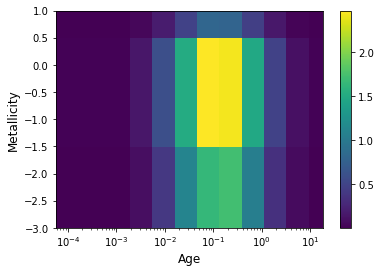

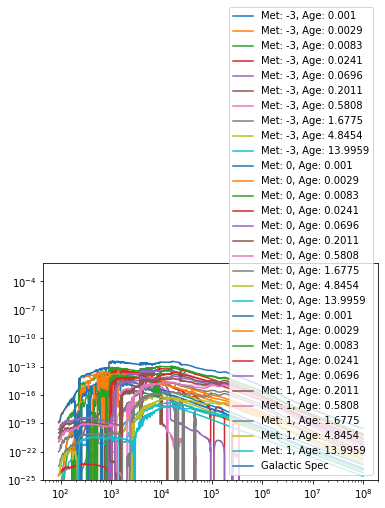

In [7]:
lb = 0
ub = int(5)

test_weight_array3, lower_bounds, upper_bounds = generate_random_weight_array(lb, ub, metallicity_space, age_space)
plt.clf()
test_weight_array3 = test_weight_array3.flatten()
print(test_weight_array3)

row_array, column_array = convert_weight_array(test_weight_array3, metallicity_space, age_space)
met_array3, age_array3 = convert_arrays(row_array, column_array, metallicity_space, age_space)

# Printing Contour Map
plt.pcolormesh(age_space, metallicity_space, test_weight_array3.reshape((len(metallicity_space), len(age_space))), shading='auto')
plt.xlabel('Age', fontsize = 12)
plt.ylabel('Metallicity', fontsize = 12)
plt.xscale('log')
plt.ylim([-3, 1])
plt.colorbar()
plt.show()
plt.clf()

test_weight_array3 = test_weight_array3.flatten()

total_spec3 = np.zeros(5994)

for i in range(len(met_array3)):
    met3 = np.array([met_array3[i]])
    age3 = np.array([age_array3[i]])
    
    theta3 = np.concatenate((met3, age3))
    spec3 = interpolating_spec(theta3)[0]
    spec3 *= test_weight_array3[i]
    plt.loglog(wave, spec3, label = "Met: {}, Age: {}".format(met3[0], age3[0]))
    total_spec3 += spec3

snorm3 = total_spec3 + np.random.normal(0., 1e-24, len(wave))
enorm3  = 1e-24 * np.ones((len(wave),))

plt.loglog(wave, snorm3, label = "Galactic Spec")
plt.legend()
plt.ylim([1e-25, 1e-2])
plt.show()

Using Optimization to get general fit for starting point.

Current Starting Position
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
Input values were (metallicity,age):
[0.01170848 0.10036406 0.41000311 1.11621415 1.64213139 1.72086807
 1.04631094 0.35037659 0.0775652  0.0123109  0.01779902 0.1537519
 0.60187913 1.50826147 2.46840892 2.42089132 1.48438974 0.48767151
 0.10775027 0.01875004 0.00604664 0.04570268 0.1926382  0.49150443
 0.80628303 0.7874754  0.46162751 0.16811531 0.03443992 0.00609814]
Optimizing Guess ***********


/apps/jupyterhub/1.1.0/lib/python3.8/site-packages/scipy/optimize/_numdiff.py:557: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/apps/jupyterhub/1.1.0/lib/python3.8/site-packages/scipy/optimize/_numdiff.py:557: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


[0.12366522 0.09531791 0.00205648 0.0457394  0.0278996  0.0193962
 0.01954897 0.01852991 0.01498386 0.01279162 0.20904711 0.28019516
 0.71848335 0.15010617 0.08648244 0.05152245 0.03154157 0.02321323
 0.01485499 0.01216115 0.27213152 0.35635908 0.4508204  0.09147282
 0.05427557 0.04808084 0.03516876 0.01711963 0.01413688 0.01226228]


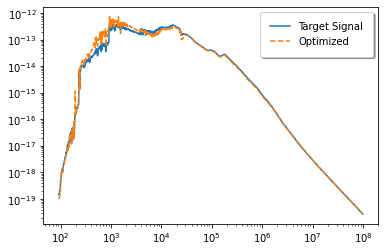

In [8]:
text_label = []

for i in range(30):
    text_label.append('mass'+ str(i))
    
lb   = np.zeros(30)
ub   = np.full(30, 5)

starting_weight_array = np.full(30, 0.01)

print("Current Starting Position")
print(starting_weight_array)
print("Input values were (metallicity,age):")
print(test_weight_array3)

print('Optimizing Guess ***********')

popt3 = optimize_guess(galactic_model_guess, starting_weight_array, lb, ub, wave, snorm3, enorm3)
print(popt3)

spec_opt_guess3 = galactic_model_guess(popt3, wave)

plt.loglog(wave, snorm3, label='Target Signal')
plt.loglog(wave,spec_opt_guess3, ls='--', label='Optimized')
plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1, prop={'size': 10})
plt.ylim([plt.ylim()[0], plt.ylim()[1]])
plt.show()

#### Intializing New Directory (only run this cell if its your first time running code today)

In [233]:
parent_directory = '/home/benjamin.hanson/blue_paul.torrey/benjamin.hanson/'
new_directory = str(date.today())
path = os.path.join(parent_directory, new_directory)
os.mkdir(path)

## Saving Variables in Case of Server Crash

In [214]:
save_variables(path, test_weight_array3, snorm3, enorm3, spec_opt_guess3)

# Running MCMC

### If Starting From Scratch on a New Sampler

In [215]:
filename = path + '/sampler.h5'
if os.path.exists(filename):
    os.remove(filename)
backend = emcee.backends.HDFBackend(filename)
backend.reset(nwalkers, ndim)
initial = True

### If Reading in a Pre-Started Sampler

In [221]:
path = '/home/benjamin.hanson/blue_paul.torrey/benjamin.hanson/2021-08-02-3'
filename = path + '/sampler.h5'
backend = emcee.backends.HDFBackend(filename)
initial = False

Parameter 0 has not converged. GR was 2.337.
Steps Taken:  500 Likelihood:  5153.186715539833
Convergence not found before break.
Total steps to converge:  500
Derived values are (weight array): 
 [0.03743959 0.10543351 0.0017132  0.04904592 0.02750325 0.01678522
 0.03727696 0.03350539 0.01395024 0.00834382 0.09215541 0.13506989
 1.32084619 0.29077576 0.12586528 0.08076548 0.01066931 0.034565
 0.01399767 0.02236003 0.04083556 0.29681221 0.31041568 0.10813272
 0.02779981 0.09166708 0.08168371 0.01600222 0.01511356 0.01840334]
Input values are (weight array): 
 [0.01170848 0.10036406 0.41000311 1.11621415 1.64213139 1.72086807
 1.04631094 0.35037659 0.0775652  0.0123109  0.01779902 0.1537519
 0.60187913 1.50826147 2.46840892 2.42089132 1.48438974 0.48767151
 0.10775027 0.01875004 0.00604664 0.04570268 0.1926382  0.49150443
 0.80628303 0.7874754  0.46162751 0.16811531 0.03443992 0.00609814]


<ipython-input-201-c84ce4ab3214>:284: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  samples=sampler.chain[:, np.rint(no_of_steps/5).astype(np.int):, :].reshape((-1, ndim))#sampler.flatchain


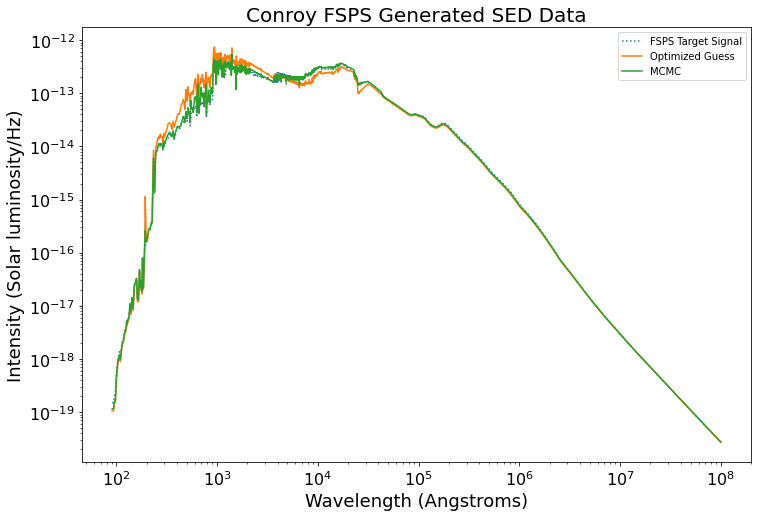

In [227]:
with Pool() as pool:
    
    text_label=[]

    for i in range(30):
        text_label.append('mass'+ str(i))

    lb   = np.zeros(30)
    ub   = np.full(30, 5)

    length_of_lb = len(lb)
    
    
    no_of_steps=1000
    
    if(initial):
        sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, pool = pool, args=(lb, ub, galactic_model_guess, wave, snorm3, enorm3), backend = backend)
        print("Start Burntime Calculations ***********")
        perturbation = popt3 * 0.1
        guesses = [popt3 + perturbation * np.random.randn(ndim) for i in range(nwalkers)]
        burntime = np.round(500)
        pos, prob, state = sampler.run_mcmc(guesses, burntime, progress = True)  #First Burning some steps
        sampler.reset()
        clear_output(wait=True)
    
        print("Done Burning Steps! Now starting the Final Calculations:")
        print("*****************")
        
    else:
        
        # Reading in Final Position when sampler last ran
        pos = []
        with open(path + '/current_pos.csv') as csv_file:
            csv_reader = csv.reader(csv_file, delimiter=',')
            for row in csv_reader:
                pos.append(list(map(float, row)))

        pos = np.array(pos)
                
        # Reading in saved variables from when sampler last ran
        test_weight_array3, snorm3, enorm3, spec_opt_guess3 = read_variables(path + "/save_variables.csv")
        
        sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, pool = pool, args=(lb, ub, galactic_model_guess, wave, snorm3, enorm3), backend = backend)

    print("Starting emcee ***********")
     
    break_steps = 1000
    convergence_accuracy = 1.1
    convergence_check = True
    convergence_filename = path + '/convergence_file.csv'
    sampler_3D, likelihood, convergences = initiate_walking(sampler, pos, no_of_steps, break_steps, convergence_accuracy, convergence_check, snorm3, enorm3, wave, galactic_model_guess, path)
        
    title = "Conroy FSPS Generated SED Data"
    galaxy = "FSPS Target Signal"

    best_fit_log, exp_weight_array_log = print_and_plot_results(sampler, wave, snorm3, title, galaxy, galactic_model_guess)
     
    print("Input values are (weight array): \n {}".format(test_weight_array3))

    plt.loglog(wave, spec_opt_guess3, label = "Optimized Guess")
    plt.loglog(wave, best_fit_log, label = "MCMC")
    plt.legend()
    plt.savefig(path + "/galactic_plot_log_final.jpg")
    plt.show()

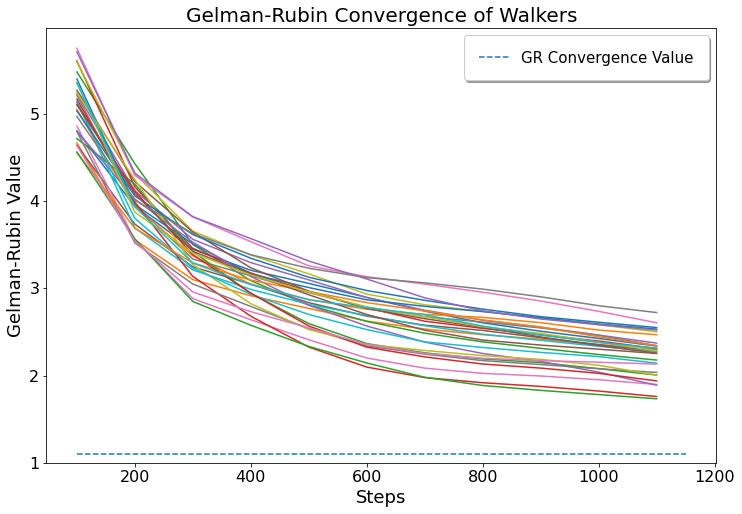

In [228]:
file_name = path + '/convergence_file.csv'

plot_convergences(file_name, convergence_accuracy, no_of_steps, path)

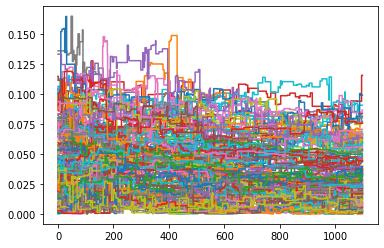

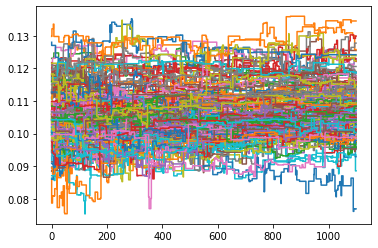

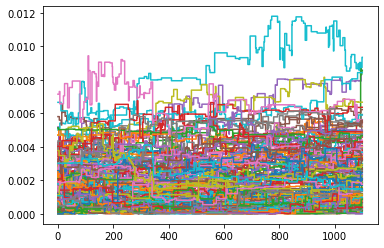

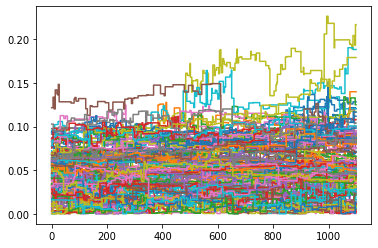

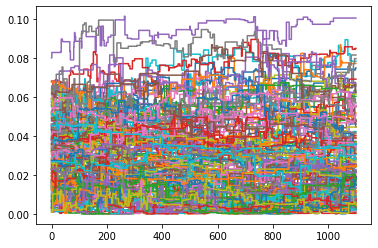

...

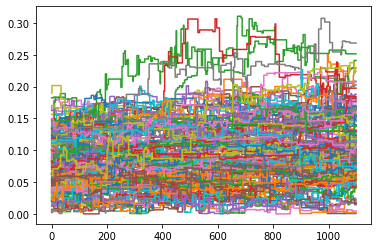

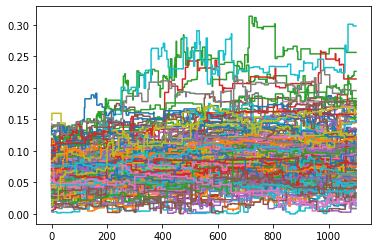

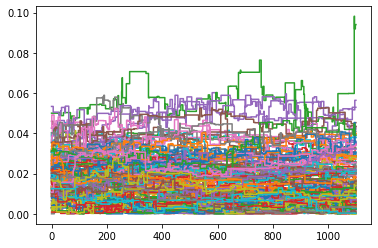

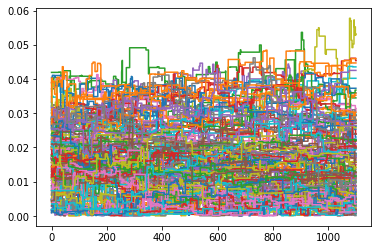

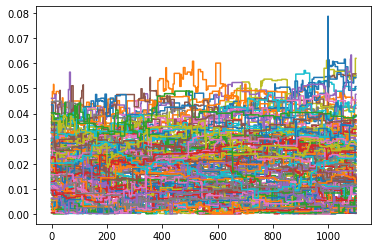

In [229]:
samples = sampler_3D.chain[:, :, :].reshape((-1, ndim))
sampler_ = np.array( sampler_3D.chain )

for this_dim in range(sampler_.shape[2]):   # number of parameters
    for walker_nr in range(sampler_.shape[0]):
        plt.step(range(sampler_.shape[1]), sampler_[walker_nr,:,this_dim])
    plt.show()

In [230]:
derived_weight = exp_weight_array_log.reshape((3, 10))
input_weight = test_weight_array3.reshape((3, 10))

derived_age_dist = np.zeros(10)
input_age_dist = np.zeros(10)
derived_met_dist = np.zeros(3)
input_met_dist = np.zeros(3)
met_err = np.zeros(3)
age_err = np.zeros(10)

y_unc = np.array(get_uncertainty(sampler))
y_unc = np.reshape(y_unc, (3,10))

for i in range(len(derived_weight)):
    for j in range(len(derived_weight[0])):
        derived_met_dist[i] += derived_weight[i][j]
        input_met_dist[i] += input_weight[i][j]
        met_err[i] += ((y_unc[i][j]) ** 2)
        
met_err = np.sqrt(met_err)

for i in range(len(derived_weight[0])):
    for j in range(len(derived_weight)):
        derived_age_dist[i] += derived_weight[j][i]
        input_age_dist[i] += input_weight[j][i]
        age_err[i] += (y_unc[j][i]) ** 2
    
age_err = np.sqrt(age_err)

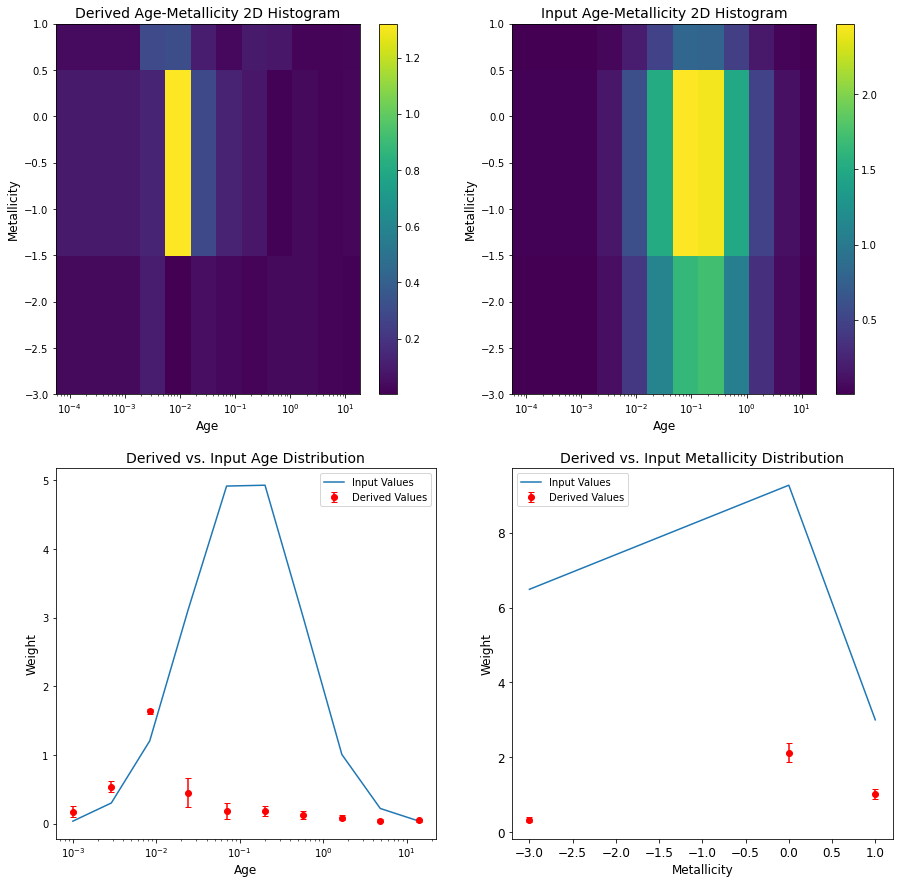

In [231]:
fig, axs = plt.subplots(2, 2, figsize=(15,15))
plt.tick_params(axis='both', which='major', labelsize=12)

plt1 = axs[0, 0].pcolormesh(age_space, metallicity_space, derived_weight, shading='auto')
axs[0, 0].set_title('Derived Age-Metallicity 2D Histogram', fontsize = 14)
plt2 = axs[0, 1].pcolormesh(age_space, metallicity_space, input_weight, shading='auto')
axs[0, 1].set_title('Input Age-Metallicity 2D Histogram', fontsize = 14)
axs[1, 0].errorbar(age_space, derived_age_dist, yerr = age_err, fmt = 'ro', ecolor = 'red', capsize = 3, ms = 6, label = "Derived Values")
axs[1, 0].plot(age_space, input_age_dist, 'tab:blue', label = "Input Values")
axs[1, 0].set_title('Derived vs. Input Age Distribution', fontsize = 14)
axs[1, 1].errorbar(metallicity_space, derived_met_dist, yerr = met_err, fmt = 'ro', ecolor = 'red', capsize = 3, ms = 6, label = "Derived Values")
axs[1, 1].plot(metallicity_space, input_met_dist, 'tab:blue', label = "Input Values")
axs[1, 1].set_title('Derived vs. Input Metallicity Distribution', fontsize = 14)

fig.colorbar(plt1, ax=axs[0, 0])
fig.colorbar(plt2, ax=axs[0, 1])

iterator = 0
for ax in axs.flat:
    if iterator == 0:
        ax.set_xlabel('Age', fontsize = 12)
        ax.set_ylabel('Metallicity', fontsize = 12)
        ax.set_xscale('log')
        ax.set_ylim([-3, 1])
    if iterator == 1:
        ax.set_xlabel('Age', fontsize = 12)
        ax.set_ylabel('Metallicity', fontsize = 12)
        ax.set_xscale('log')
        ax.set_ylim([-3, 1])
    if iterator == 2:
        ax.set_xlabel('Age', fontsize = 12)
        ax.set_ylabel('Weight', fontsize = 12)
        ax.set_xscale('log')
        ax.legend()
    if iterator == 3:
        ax.set_xlabel('Metallicity', fontsize = 12)
        ax.set_ylabel('Weight', fontsize = 12) 
        ax.legend()
    iterator += 1
    
plt.savefig(path + "/model_distributions.jpg")    
plt.show()

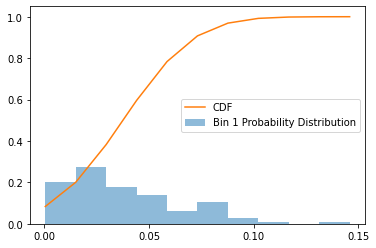

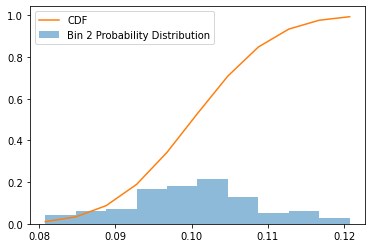

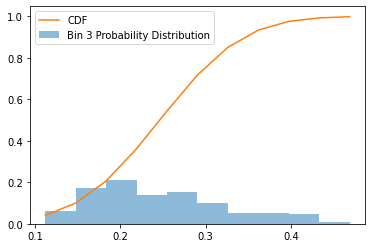

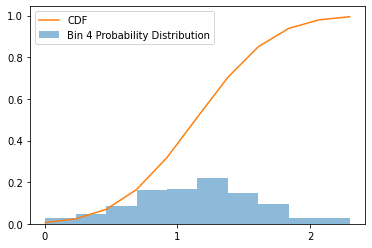

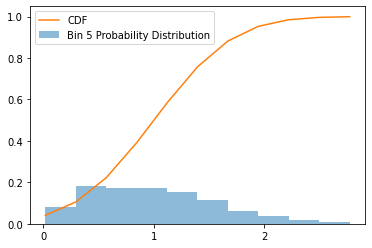

...

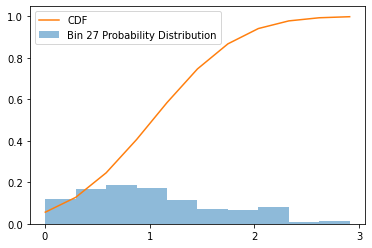

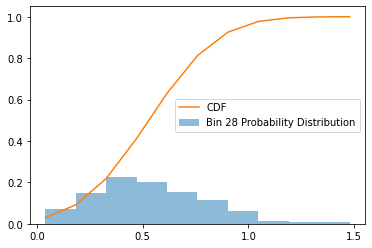

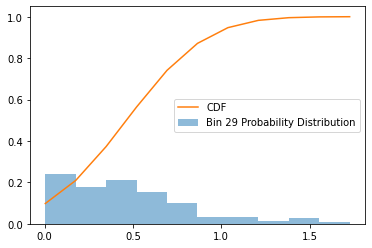

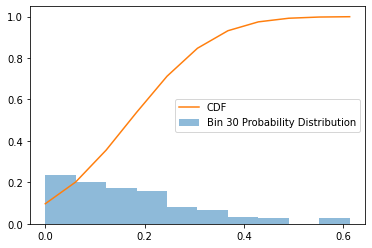

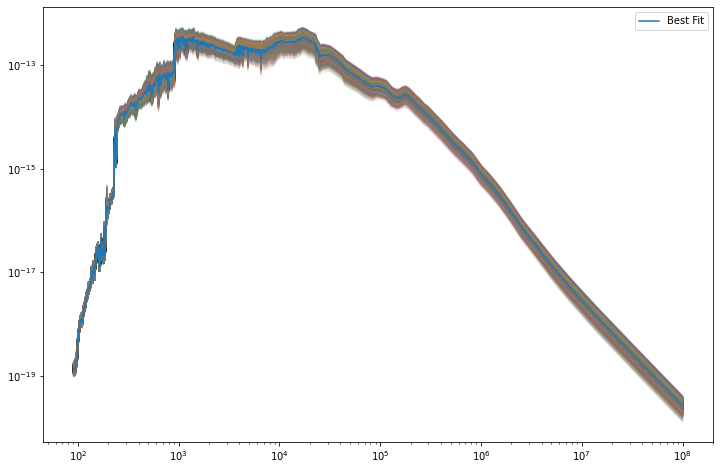

Derived Mass-to-light Ratio: 1.505e-02 +/- 1.756e-03
Input Mass-to-light Ratio: 1.330e-02
Standard Deviations Away: 1.000


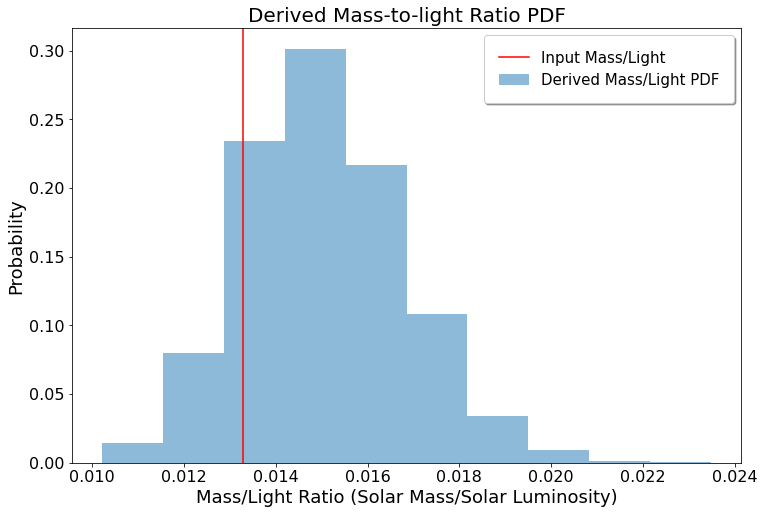

In [211]:
samples = 5000
derived_mass_light, derived_mass_light_err, mass_light_array, derived_spec_array, weight_array = mass_light_pdf(sampler_3D, samples, snorm3, wave, best_fit_log)
input_mass_light = mass_to_light_calc(test_weight_array3, snorm3, wave)

print("Derived Mass-to-light Ratio: {:.3e} +/- {:.3e}".format(derived_mass_light, derived_mass_light_err))
print("Input Mass-to-light Ratio: {:.3e}".format(input_mass_light))
print("Standard Deviations Away: {:.3f}".format(abs((derived_mass_light - input_mass_light)/(derived_mass_light_err))))
plt.axvline(x = input_mass_light, color = 'red', label = "Input Mass/Light")
plt.title('Derived Mass-to-light Ratio PDF', fontsize = 20)
plt.ylabel('Probability', fontsize = 18) # Labeling the x-axis
plt.xlabel('Mass/Light Ratio (Solar Mass/Solar Luminosity)', fontsize = 18) # Labeling the y-axis
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1, prop={'size': 15})  

#plt.savefig("mass_light_log_pdf_3D.jpg")    
plt.show()

## Prospector

In [110]:
test_weight_array, target_spec, enorm, spec_opt_guess = read_variables(path + "/save_variables.csv")

synth_spec_maggies = convert_maggies(target_spec)

In [111]:
def build_obs():
    """Build a dictionary of observational data.  In this example 
    the data consist of photometry for a single nearby dwarf galaxy 
    from Johnson et al. 2013.
    
    :param snr:
        The S/N to assign to the photometry, since none are reported 
        in Johnson et al. 2013
        
    :param ldist:
        The luminosity distance to assume for translating absolute magnitudes 
        into apparent magnitudes.
        
    :returns obs:
        A dictionary of observational data to use in the fit.
    """
    from prospect.utils.obsutils import fix_obs
    import sedpy

    # The obs dictionary, empty for now
    obs = {}

    obs["filters"] = None
    obs["maggies"] = None
    obs["maggies_unc"] = None
    obs["phot_mask"] = None
    obs["phot_wave"] = None


    obs["wavelength"] = wave
    obs["spectrum"] = synth_spec_maggies
    obs['unc'] = synth_spec_maggies * 0.001
    obs['mask'] = np.isfinite(synth_spec_maggies)

    # This function ensures all required keys are present in the obs dictionary,
    # adding default values if necessary
    obs = fix_obs(obs)

    return obs

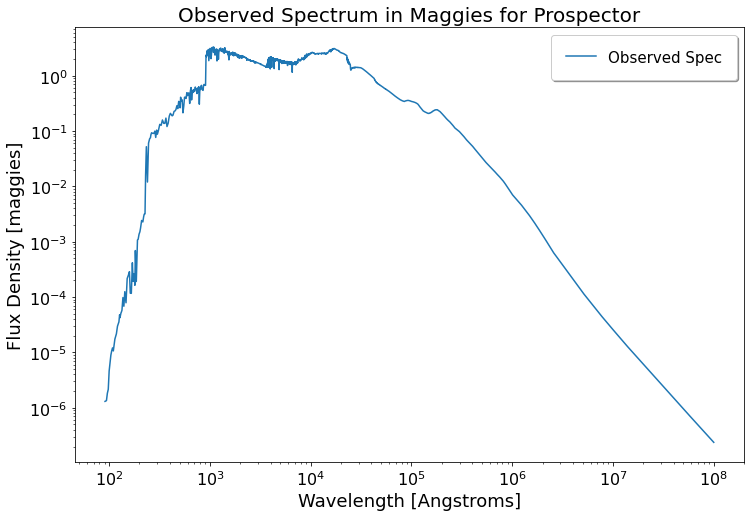

In [112]:
# Build the obs dictionary using the meta-parameters
obs = build_obs()

fig = plt.figure(figsize=(12,8))

# --- Plot the Data ----
# This is why we stored these...
wave = obs["wavelength"]
spectrum = obs["spectrum"]

plt.loglog(wave, spectrum, label = "Observed Spec")

plt.xlabel('Wavelength [Angstroms]', fontsize = 18)
plt.ylabel('Flux Density [maggies]', fontsize = 18)
plt.title("Observed Spectrum in Maggies for Prospector", fontsize = 20)
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1, prop={'size': 15})
plt.show()

In [179]:
from prospect.models import priors, transforms #helper functions for specifying priors
from prospect.models import sedmodel
def build_model(**kwargs):
    
    """
    Function to build model components for SFH and dust. 
    The model params are defined by their name, whether they are a free parameter
    their initial value, and their prior distribution if they are variable. The model 
    params are then fed to the prospector SedModel class
    
    All parameters except 'mass' correspond to fsps model parameters, the definitions of which you can find here:
    https://dfm.io/python-fsps/current/stellarpop_api/
    
    This time, we will be using something called a non-parametric star formation history model. You don't
    _really_ need to understand this in detail, but if you want to read up on it here's a few places to start:
    https://arxiv.org/abs/1811.03637
    https://arxiv.org/abs/2006.03599
    
    The 
    
    """
    
    model_params = []
    #redshift of galaxy. Working with simulated data is weird in that our galaxy is at redshift 0, specifically
    #our observed SED is at a luminosity distance of 10 pc --> completely unphysical in the real Universe but 
    #ultimately doesn't matter because we can just fix that value in our model
    model_params.append({'name': "zred", "N": 1, "isfree": False,"init": 0.1, 'prior': None})
    model_params.append({'name': "lumdist", "N": 1, "isfree": False,"init": 1e-5, 'units': 'Mpc'})
    #IMF model which will be used by the simple stellar population model
    model_params.append({'name': 'imf_type', 'N': 1,'isfree': False,'init': 2, 'prior': None})
    #stellar mass
    model_params.append({'name': 'logmass', 'N': 1,'isfree': True, 'init': 1.2,'prior': priors.TopHat(mini = 1.1, maxi= 8)})
    #stellar metallicity
    model_params.append({'name': 'logzsol', 'N': 1,'isfree': True,'init': -0.5,'prior': priors.TopHat(mini=-3, maxi=1)})
    #non parametric SFH model
    #essentially, this model is comprised of a handful of piece-wise bins of constant SFR. the prior on the 
    # normalization (shape) of the SFH is a Dirichlet distribution 
    model_params.append({'name': "sfh", "N": 1, "isfree": False, "init": 3})
    #here, mass =/= the total stellar mass, but rather the stellar mass in each bin of constant SFR
    # these parameters depend on the z_fraction parameters through a conversion
    model_params.append({'name': "mass", 'N': 3, 'isfree': False, 'init': 1., 'depends_on':zfrac_to_masses_log})
    model_params.append({'name': "agebins", 'N': 1, 'isfree': False,'init': []})
    # this proxy parameter is what's actually varied in the SFH model
    model_params.append({'name': "z_fraction", "N": 2, 'isfree': True, 'init': [0, 0],'prior': priors.Beta(alpha=1.0, beta=1.0, mini=0.0, maxi=1.0)})
    #dust attenuation model, from Kriek & Conroy 2013, this time we allow a variable attenuation curve slope
    model_params.append({'name': 'dust_type', 'N': 1,'isfree': False,'init': 4,'prior': None})
    #the attenuation (in magnitudes) in the V-band
    model_params.append({'name': 'dust2', 'N': 1,'isfree': False, 'init': 0,'prior': priors.ClippedNormal(mini=0.0, maxi=2.0, mean=0.0, sigma=0.3)})
    #the attenuation (in magnitudes) in the V-band
    model_params.append({'name': 'dust_index', 'N': 1,'isfree': False, 'init': 0,'prior': priors.TopHat(mini=-1.6, maxi=0.3)})
    #dust emission model -- only 1 choice, from Draine & Li 2007
    model_params.append({'name': 'add_dust_emission', 'N': 1,'isfree': False,'init': 0,'prior': None})
    #mass fraction of warm dust
    model_params.append({'name': 'duste_gamma', 'N': 1,'isfree': False,'init': 0,'prior': priors.TopHat(mini=0.0, maxi=1.0)})
    #minimum radiation field
    model_params.append({'name': 'duste_umin', 'N': 1,'isfree': False,'init': 0,'prior': priors.TopHat(mini=0.1, maxi=20.0)})
    #mass fraction of dust in PAHs
    model_params.append({'name': 'duste_qpah', 'N': 1,'isfree': False,'init': 0,'prior': priors.TopHat(mini=0.0, maxi=6.0)})
    
    #now modify our SFH model to our specifications
    n = [p['name'] for p in model_params]
    #tuniv = 14.0
    nbins=10 #6 bins of constant SFR
    #tbinmax = (tuniv * 0.85) * 1e9
    #lim1, lim2 = 8.0, 8.52 #100 Myr and 330 Myr so our choice of both # and placement of timebins are ~arbitrary, but i space them out evenly in log(time) space
    #agelims = [0,lim1] + np.linspace(lim2,np.log10(tbinmax),nbins-2).tolist() + [np.log10(tuniv*1e9)]
    #agebins = np.array([agelims[:-1], agelims[1:]])
    low_age_lim = np.logspace(-3, 1.146, 10)
    low_age_lim *= 1e9
    high_age_lim = np.logspace(-3, 1.146, 10)
    high_age_lim *= 1e9
    
    low_age_lim = np.log10(low_age_lim)
    high_age_lim = np.log10(high_age_lim)
    low_age_lim = np.concatenate((np.array([0]), low_age_lim))
    low_age_lim = low_age_lim[:-1]
    
    agebins = np.array([low_age_lim, high_age_lim])
    
    ncomp = nbins
    alpha_sfh = 0.7  # desired Dirichlet concentration                                                                                                       \                                                                                                                                                   
    alpha = np.repeat(alpha_sfh,nbins-1)
    tilde_alpha = np.array([alpha[i-1:].sum() for i in range(1,ncomp)])
    zinit = np.array([(i-1)/float(i) for i in range(ncomp, 1, -1)])
    zprior = priors.Beta(alpha=tilde_alpha, beta=np.ones_like(alpha), mini=0.0, maxi=1.0)
    model_params[n.index('mass')]['N'] = ncomp
    model_params[n.index('agebins')]['N'] = ncomp
    model_params[n.index('agebins')]['init'] = agebins.T
    model_params[n.index('z_fraction')]['N'] = len(zinit)
    model_params[n.index('z_fraction')]['init'] = zinit
    model_params[n.index('z_fraction')]['prior'] = zprior
    
    model = sedmodel.SedModel(model_params)
    return model, agebins

In [180]:
from prospect.sources import FastStepBasis
def build_sps(**kwargs):
    """
    This is our stellar population model which generates the spectra for stars of a given age and mass. 
    Because we are using a non parametric SFH model, we do have to use a different SPS model than before 
    """
    sps = FastStepBasis(zcontinuous=1)
    return sps

In [181]:
age_space = np.logspace(-3, 1.146, 10)
mod, agebins = build_model()
sps = build_sps()
print(mod)

:::::::
<class 'prospect.models.sedmodel.SedModel'>

Free Parameters: (name: prior) 
-----------
  logmass: <class 'prospect.models.priors.TopHat'>(mini=1.1,maxi=8)
  logzsol: <class 'prospect.models.priors.TopHat'>(mini=-3,maxi=1)
  z_fraction: <class 'prospect.models.priors.Beta'>(mini=0.0,maxi=1.0,alpha=[6.3 5.6 4.9 4.2 3.5 2.8 2.1 1.4 0.7],beta=[1. 1. 1. 1. 1. 1. 1. 1. 1.])

Fixed Parameters: (name: value [, depends_on]) 
-----------
  zred: [0.1] 
  lumdist: [1.e-05] 
  imf_type: [2] 
  sfh: [3] 
  mass: [1.] <function zfrac_to_masses_log at 0x2b48a8df7dc0>
  agebins: [[ 0.          6.        ]
 [ 6.          6.46066667]
 [ 6.46066667  6.92133333]
 [ 6.92133333  7.382     ]
 [ 7.382       7.84266667]
 [ 7.84266667  8.30333333]
 [ 8.30333333  8.764     ]
 [ 8.764       9.22466667]
 [ 9.22466667  9.68533333]
 [ 9.68533333 10.146     ]] 
  dust_type: [4] 
  dust2: [0] 
  dust_index: [0] 
  add_dust_emission: [0] 
  duste_gamma: [0] 
  duste_umin: [0] 
  duste_qpah: [0] 


In [182]:
# Setting Prospector Fitting Settings
run_params = {}
run_params["sps_libraries"] = sps.ssp.libraries
run_params["dynesty"] = False
run_params["emcee"] = True
run_params["optimize"] = False
# Number of emcee walkers
run_params["nwalkers"] = nwalkers
# Number of iterations of the MCMC sampling
run_params["niter"] = 250
# Number of iterations in each round of burn-in
# After each round, the walkers are reinitialized based on the 
# locations of the highest probablity half of the walkers.
run_params["nburn"] = [16, 32, 64]

In [183]:
out_file = path + "/prospector.h5"
output = fit_model(obs, mod, sps, **run_params)
writer.write_hdf5(out_file, run_params, mod, obs,
              output["sampling"][0], output["optimization"][0],
              tsample=output["sampling"][1],
              toptimize=output["optimization"][1])

number of walkers=150


/home/benjamin.hanson/.local/lib/python3.8/site-packages/prospect/models/priors.py:104: RuntimeWarning: divide by zero encountered in log
  lnp = np.log(p)
/apps/jupyterhub/1.1.0/lib/python3.8/site-packages/numpy/core/fromnumeric.py:87: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


done burn #0 (16 iterations)
done burn #1 (32 iterations)
done burn #2 (64 iterations)
number of walkers=150
starting production
done production


/home/benjamin.hanson/.local/lib/python3.8/site-packages/prospect/io/write_results.py:60: RuntimeWarning: Could not store paramfile text
  warnings.warn("Could not store paramfile text", RuntimeWarning)
/home/benjamin.hanson/.local/lib/python3.8/site-packages/prospect/io/write_results.py:290: RuntimeWarning: Could not JSON serialize run_params, pickled instead
  warnings.warn("Could not JSON serialize {}, pickled instead".format(k),
/home/benjamin.hanson/.local/lib/python3.8/site-packages/prospect/io/write_results.py:290: RuntimeWarning: Could not JSON serialize model_params, pickled instead
  warnings.warn("Could not JSON serialize {}, pickled instead".format(k),


In [184]:
results = pread.results_from(out_file)

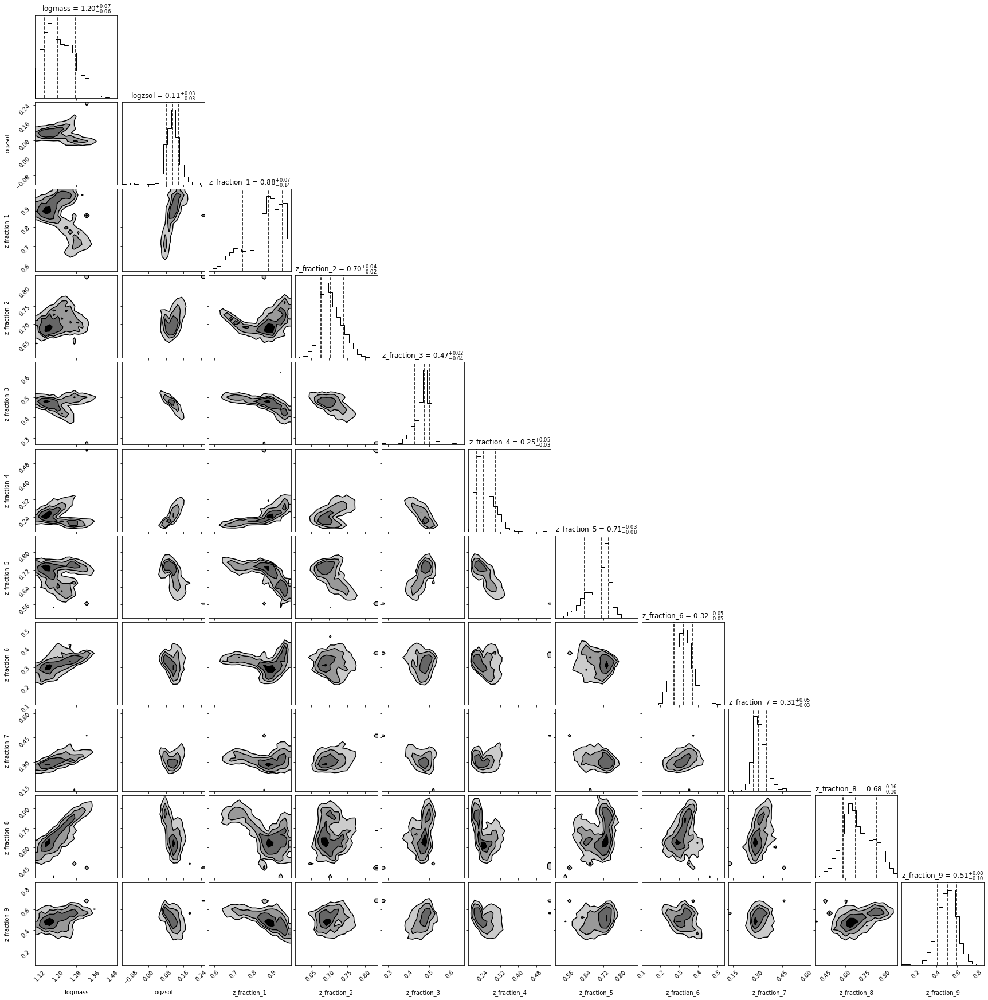

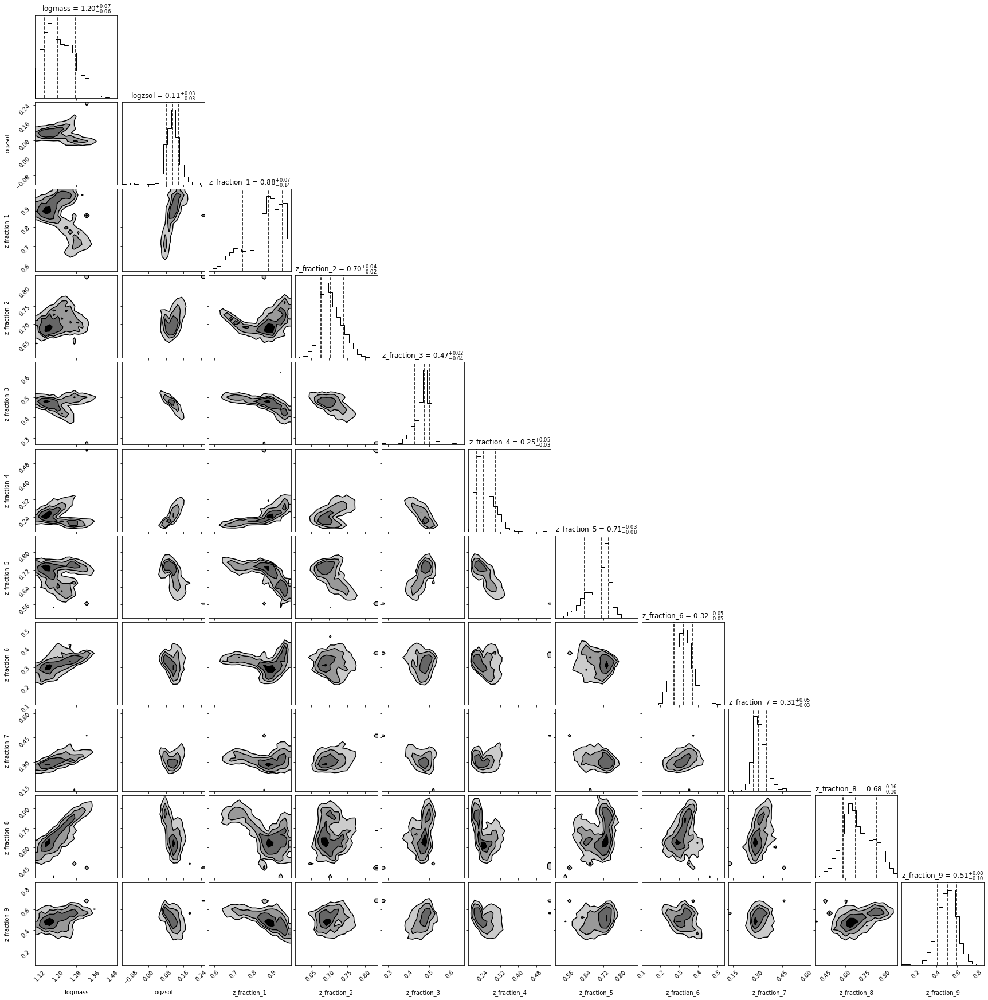

In [185]:
pread.subcorner(results[0])

In [186]:
import prospect.io.read_results as reader
results_type = "emcee" # | "dynesty"
# grab results (dictionary), the obs dictionary, and our corresponding models
# When using parameter files set `dangerous=True`
result, obs, _ = reader.results_from(out_file, dangerous=False)

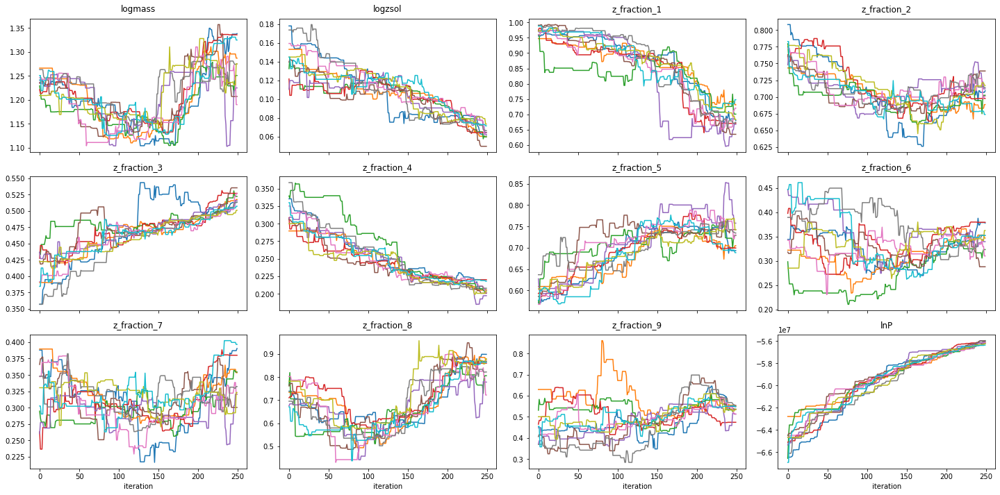

In [187]:
if results_type == "emcee":
    chosen = np.random.choice(result["run_params"]["nwalkers"], size=10, replace=False)
    tracefig = reader.traceplot(result, figsize=(20,10), chains=chosen)
else:
    tracefig = reader.traceplot(result, figsize=(20,10))

In [188]:
# maximum a posterior (of the locations visited by the MCMC sampler)
imax = np.argmax(result['lnprobability'])
if results_type == "emcee":
    i, j = np.unravel_index(imax, result['lnprobability'].shape)
    theta_max = result['chain'][i, j, :].copy()
    thin = 5
else:
    theta_max = result["chain"][imax, :]
    thin = 1

mspec_map, mphot_map, _ = mod.mean_model(theta_max, obs, sps=sps)

MAP value: [1.11222936 0.02683039 0.77631809 0.6694411  0.56716067 0.17786333
 0.70249248 0.29527998 0.36180388 0.59474364 0.37515785]


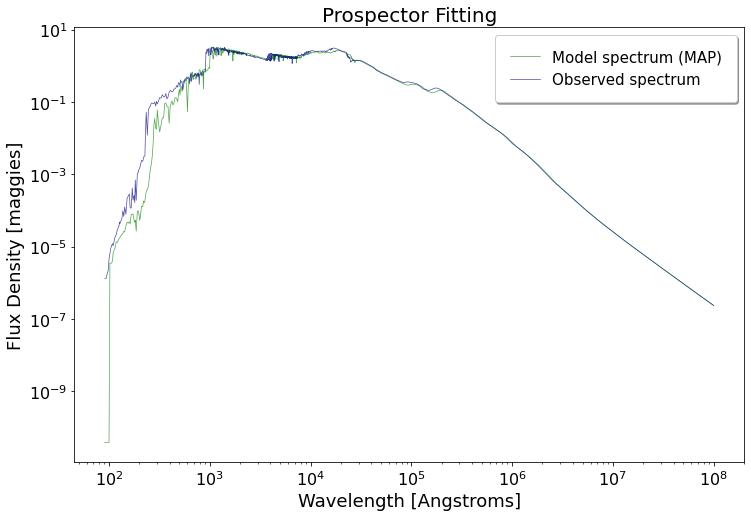

In [189]:
# Make plot of data and model
fig = plt.figure(figsize=(12,8))
print('MAP value: {}'.format(theta_max))
wspec = obs["wavelength"]

plt.loglog(wspec, mspec_map, label='Model spectrum (MAP)',
       lw=0.7, color='green', alpha=0.7)
plt.loglog(obs["wavelength"], obs['spectrum'], label='Observed spectrum', 
       lw=0.7, color='navy', alpha=0.7)

plt.xlabel('Wavelength [Angstroms]', fontsize = 18)
plt.ylabel('Flux Density [maggies]', fontsize = 18)
plt.title("Prospector Fitting", fontsize = 20)
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1, prop={'size': 15})
plt.show()

In [190]:
def zfrac_to_masses_log(logmass=None, z_fraction=None, agebins=None, **extras):
    sfr_fraction = np.zeros(len(z_fraction) + 1)
    sfr_fraction[0] = 1.0 - z_fraction[0]
    for i in range(1, len(z_fraction)):
        sfr_fraction[i] = np.prod(z_fraction[:i]) * (1.0 - z_fraction[i])
    sfr_fraction[-1] = 1 - np.sum(sfr_fraction[:-1])
    time_per_bin = np.diff(10**agebins, axis=-1)[:, 0]
    mass_fraction = sfr_fraction * np.array(time_per_bin)
    mass_fraction /= mass_fraction.sum()

    masses = 10**logmass * mass_fraction
    return masses

In [191]:
logmass = theta_max[0]
logzsol = theta_max[1]
zfrac = theta_max[2:11]
agebins = np.reshape(agebins, (10, 2))
masses = zfrac_to_masses_log(logmass, zfrac, agebins)

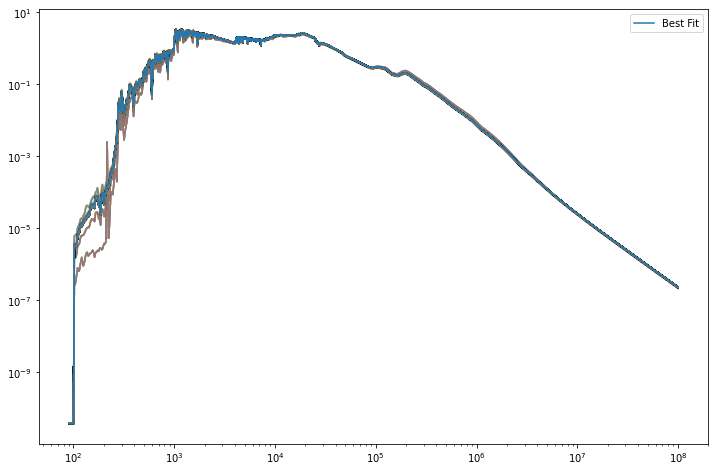

In [192]:
samples = 5000
metallicity_space = np.array([theta_max[1]])
prospector_unc, prospector_m_l = prospector_results(results, run_params["niter"], agebins, samples)

In [193]:
test_weight_array = np.array(list(map(float, test_weight_array)))
input_weight = test_weight_array.reshape((3, 10))

input_age_dist = np.zeros(10)

for i in range(len(input_weight[0])):
    for j in range(len(input_weight)):
        input_age_dist[i] += input_weight[j][i]

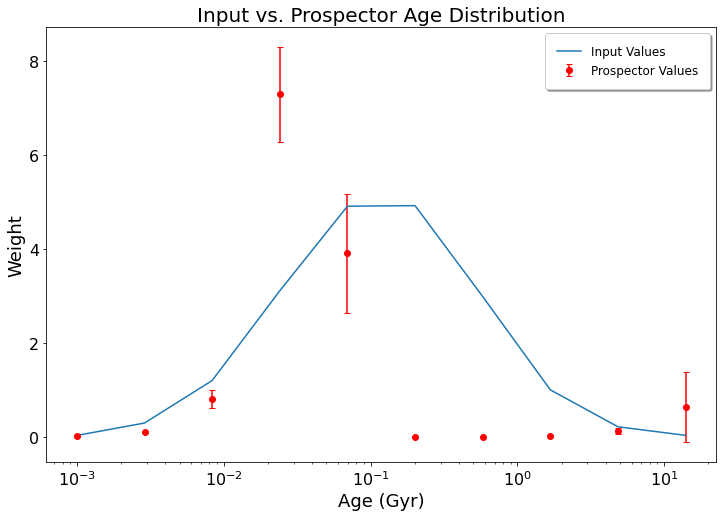

In [194]:
import matplotlib.pyplot as plt

fig= plt.figure(figsize=(12,8))
plt.errorbar(age_space, masses, yerr = prospector_unc, fmt = 'ro', ecolor = 'red', capsize = 3, ms = 6, label = "Prospector Values")
plt.plot(age_space, input_age_dist, 'tab:blue', label = "Input Values")
plt.xscale("log")
plt.title('Input vs. Prospector Age Distribution', fontsize = 20)
plt.ylabel('Weight', fontsize = 18) # Labeling the x-axis
plt.xlabel('Age (Gyr)', fontsize = 18) # Labeling the y-axis
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1, prop={'size': 12})     
plt.show()

Prospector Mass-to-light Ratio: 1.626e-02 +/- 1.830e-03
Input Mass-to-light Ratio: 1.330e-02
Standard Deviations Away: 1.622


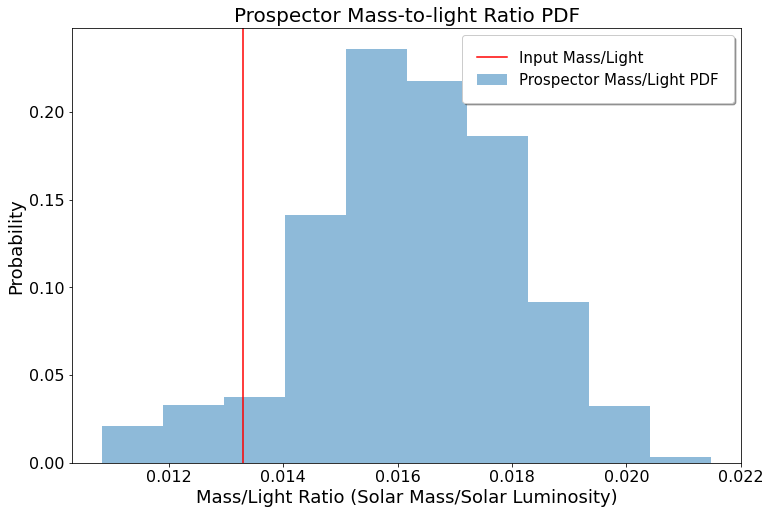

In [195]:
fig = plt.figure(figsize = (12, 8))
count, bins = np.histogram(prospector_m_l)
prob = count / sum(count)
plt.hist(bins[:-1], bins, alpha = 0.5, weights=prob, label = "Prospector Mass/Light PDF".format(i))
prospector_mass_light, prospector_mass_light_err = scipy.stats.norm.fit(prospector_m_l)

age_space = np.logspace(-3, 1.146, 10)
metallicity_space = np.array([-3, 0, 1])
input_mass_light = mass_to_light_calc(test_weight_array, target_spec, wave)

print("Prospector Mass-to-light Ratio: {:.3e} +/- {:.3e}".format(prospector_mass_light, prospector_mass_light_err))
print("Input Mass-to-light Ratio: {:.3e}".format(input_mass_light))
print("Standard Deviations Away: {:.3f}".format(abs((prospector_mass_light - input_mass_light)/(prospector_mass_light_err))))
plt.axvline(x = input_mass_light, color = 'red', label = "Input Mass/Light")
plt.title('Prospector Mass-to-light Ratio PDF', fontsize = 20)
plt.ylabel('Probability', fontsize = 18) # Labeling the x-axis
plt.xlabel('Mass/Light Ratio (Solar Mass/Solar Luminosity)', fontsize = 18) # Labeling the y-axis
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1, prop={'size': 15})  

#plt.savefig("mass_light_log_pdf_3D.jpg")    
plt.show()

# Putting it all Together

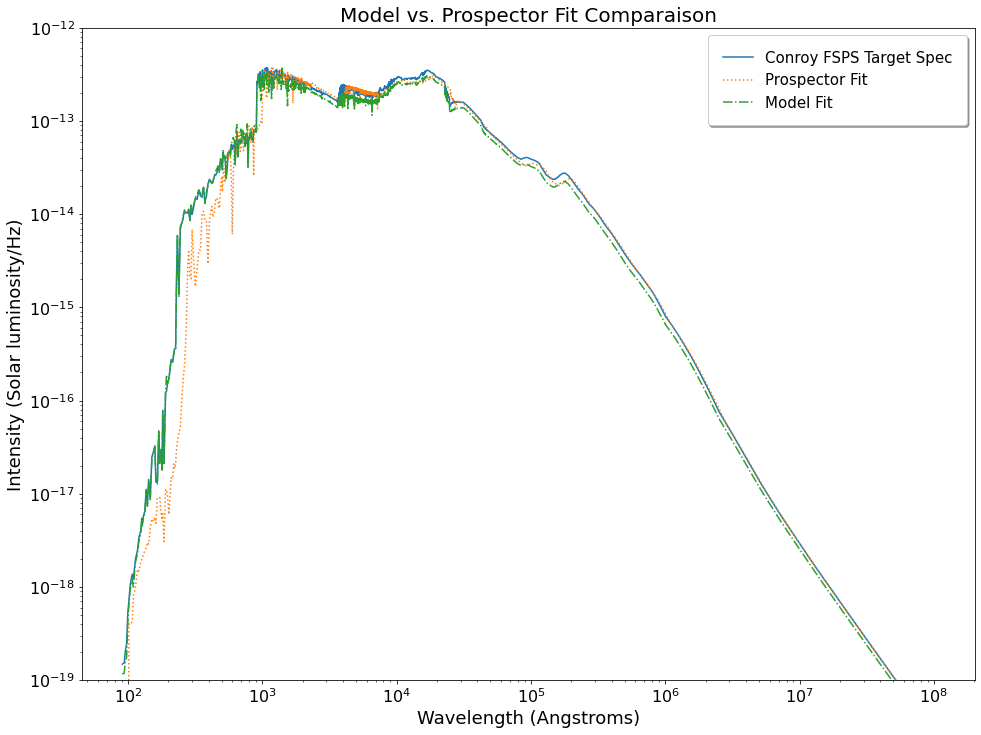

In [196]:
fig = plt.figure(figsize = (16, 12))
prospector_fit = convert_lum_hz(mspec_map)
plt.loglog(wave, target_spec, ls = 'solid', label= "Conroy FSPS Target Spec") 
plt.loglog(wave, prospector_fit, ls = ":", label = "Prospector Fit")
plt.loglog(wave, best_fit_log, ls = "-.", label = "Model Fit")
plt.title("Model vs. Prospector Fit Comparaison", fontsize = 20)
plt.ylabel('Intensity (Solar luminosity/Hz)', fontsize = 18) # Labeling the x-axis
plt.xlabel('Wavelength (Angstroms)', fontsize = 18) # Labeling the y-axis
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.ylim([1e-19, 1e-12])
plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1, prop={'size': 15})
plt.savefig(path + '/Fit_comparison.jpg')
plt.show()

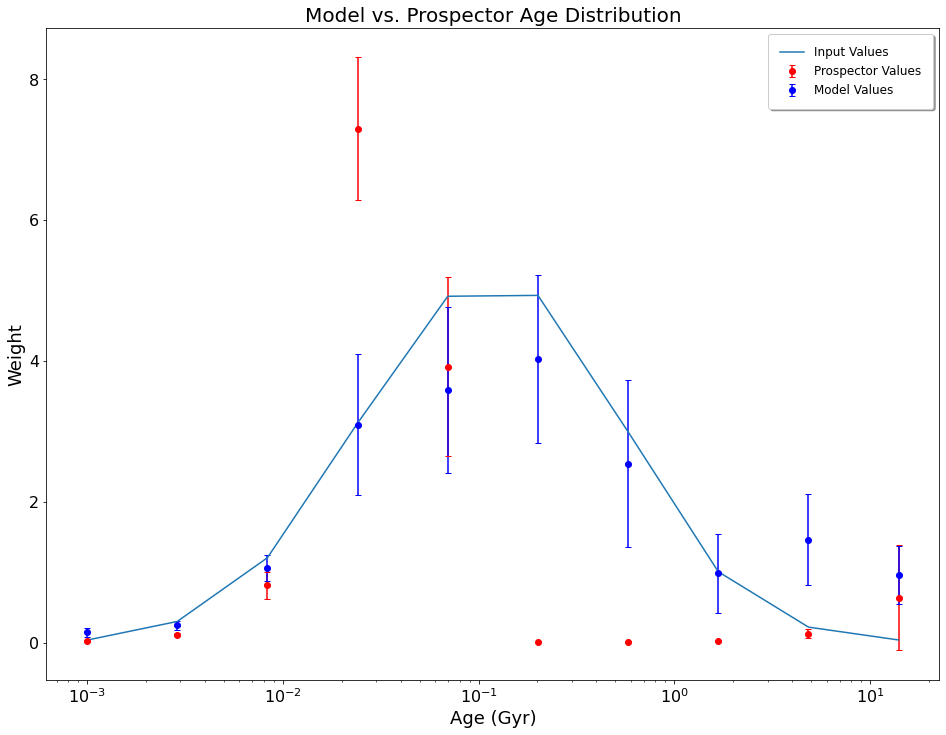

In [210]:
import matplotlib.pyplot as plt

fig= plt.figure(figsize=(16,12))
plt.errorbar(age_space, masses, yerr = prospector_unc, fmt = 'ro', ecolor = 'red', capsize = 3, ms = 6, label = "Prospector Values")
plt.errorbar(age_space, derived_age_dist, yerr = age_err, fmt = 'bo', ecolor = 'blue', capsize = 3, ms = 6, label = "Model Values")
plt.plot(age_space, input_age_dist, 'tab:blue', label = "Input Values")
plt.xscale("log")
plt.title('Model vs. Prospector Age Distribution', fontsize = 20)
plt.ylabel('Weight', fontsize = 18) # Labeling the x-axis
plt.xlabel('Age (Gyr)', fontsize = 18) # Labeling the y-axis
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1, prop={'size': 12})  
plt.savefig(path + "/Age_Distributions.jpg")    
plt.show()

Model Derived Mass-to-light Ratio: 1.510e-02 +/- 1.844e-03
Prospector Derived Mass-to-light Ratio: 1.626e-02 +/- 1.830e-03
Input Mass-to-light Ratio: 1.330e-02
Model Standard Deviations Away: 0.979
Prospector Standard Deviations Away: 1.622


<Figure size 432x288 with 0 Axes>

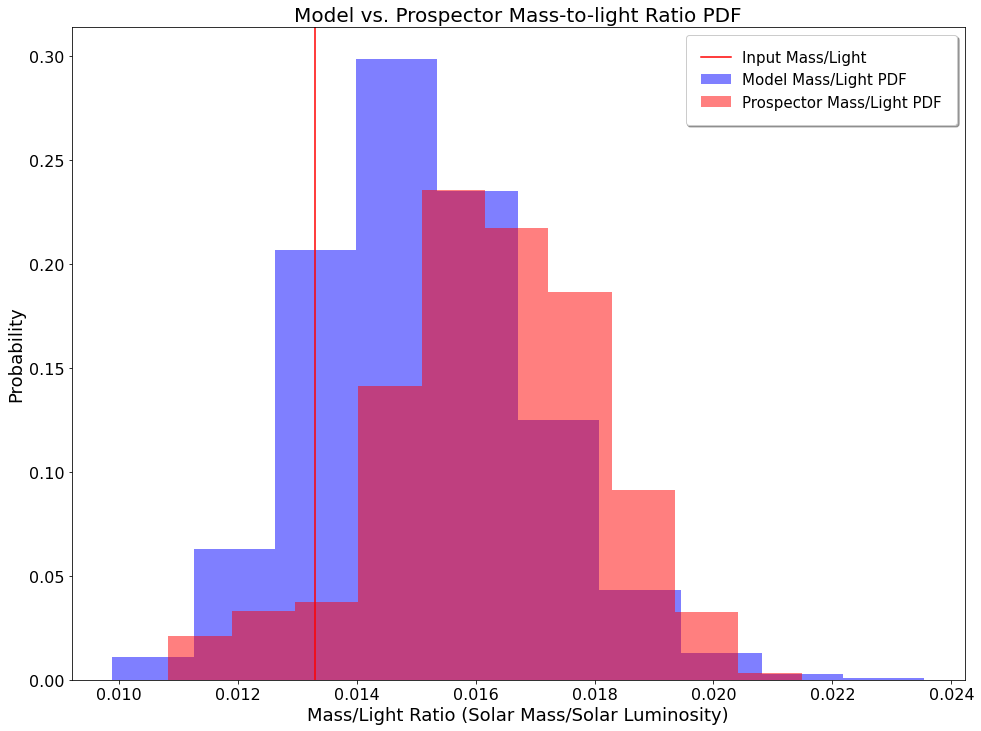

In [212]:
samples = 5000
model_values = [sampler_3D, samples, wave, snorm3]
prospector_values = [prospector_m_l, age_space, logzsol]
model_mass_light, model_mass_light_err, prospector_mass_light, prospector_mass_light_err = run_both_mass_light(model_values, prospector_values)
input_mass_light = mass_to_light_calc(test_weight_array3, snorm3, wave)

print("Model Derived Mass-to-light Ratio: {:.3e} +/- {:.3e}".format(model_mass_light, model_mass_light_err))
print("Prospector Derived Mass-to-light Ratio: {:.3e} +/- {:.3e}".format(prospector_mass_light, prospector_mass_light_err))
print("Input Mass-to-light Ratio: {:.3e}".format(input_mass_light))
print("Model Standard Deviations Away: {:.3f}".format(abs((model_mass_light - input_mass_light)/(model_mass_light_err))))
print("Prospector Standard Deviations Away: {:.3f}".format(abs((prospector_mass_light - input_mass_light)/(prospector_mass_light_err))))
plt.axvline(x = input_mass_light, color = 'red', label = "Input Mass/Light")
plt.title('Model vs. Prospector Mass-to-light Ratio PDF', fontsize = 20)
plt.ylabel('Probability', fontsize = 18) # Labeling the x-axis
plt.xlabel('Mass/Light Ratio (Solar Mass/Solar Luminosity)', fontsize = 18) # Labeling the y-axis
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1, prop={'size': 15})  
plt.savefig(path + "/Mass_to_light.jpg")    
plt.show()

## Removing Metallicity Dependence

In [15]:
metallicity_space = np.array([0])
age_space = np.logspace(-3, 1.146, 10)

[0.00042557 0.00441534 0.02463013 0.07718861 0.13825857 0.15597312
 0.08830675 0.03457794 0.00702198 0.00117033]


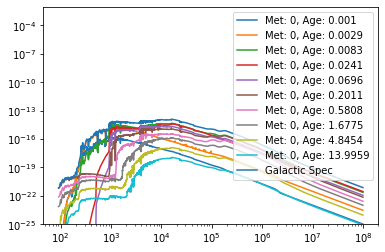

In [16]:
lb = 0
ub = int(5)

test_weight_array4 = np.array(generate_random_weight_array(lb, ub, metallicity_space, age_space))
plt.clf()
test_weight_array4 = test_weight_array4.flatten()
print(test_weight_array4)

row_array, column_array = convert_weight_array(test_weight_array4, metallicity_space, age_space)
met_array4, age_array4 = convert_arrays(row_array, column_array, metallicity_space, age_space)

total_spec4 = np.zeros(5994)

for i in range(len(met_array4)):
    met4 = np.array([met_array4[i]])
    age4 = np.array([age_array4[i]])
    
    theta4 = np.concatenate((met4, age4))
    spec4 = interpolating_spec(theta4)[0]
    spec4 *= test_weight_array4[i]
    plt.loglog(wave, spec4, label = "Met: {}, Age: {}".format(met4[0], age4[0]))
    total_spec4 += spec4

snorm4 = total_spec4 + np.random.normal(0., 1e-24, len(wave))
enorm4  = 1e-24 * np.ones((len(wave),))

plt.loglog(wave, snorm4, label = "Galactic Spec")
plt.legend()
plt.ylim([1e-25, 1e-2])
plt.show()

Current Starting Position
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01]
Input values were (metallicity,age):
[0.00042557 0.00441534 0.02463013 0.07718861 0.13825857 0.15597312
 0.08830675 0.03457794 0.00702198 0.00117033]
Optimizing Guess ***********


/apps/jupyterhub/1.1.0/lib/python3.8/site-packages/scipy/optimize/_numdiff.py:557: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/apps/jupyterhub/1.1.0/lib/python3.8/site-packages/scipy/optimize/_numdiff.py:557: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


[6.61611951e-06 8.66986283e-03 1.17069862e-01 3.30811426e-02
 2.03284864e-02 2.19498818e-02 1.54339321e-02 1.34197893e-02
 1.11217446e-02 1.04734324e-02]


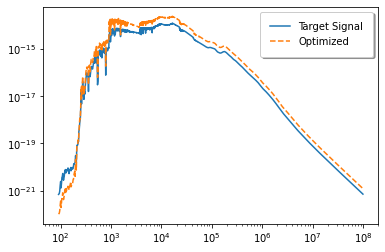

In [17]:
text_label = []

for i in range(10):
    text_label.append('mass'+ str(i))
    
lb   = np.zeros(10)
ub   = np.full(10, 1e10)

starting_weight_array = np.full(10, 0.01)

print("Current Starting Position")
print(starting_weight_array)
print("Input values were (metallicity,age):")
print(test_weight_array4)

print('Optimizing Guess ***********')

popt4 = optimize_guess(galactic_model_guess, starting_weight_array, lb, ub, wave, snorm4, enorm4)
print(popt4)

spec_opt_guess4 = galactic_model_guess(popt4, wave)

plt.loglog(wave, snorm4, label='Target Signal')
plt.loglog(wave,spec_opt_guess4, ls='--', label='Optimized')
plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1, prop={'size': 10})
plt.ylim([plt.ylim()[0], plt.ylim()[1]])
plt.show()

Steps Taken:  10000 Likelihood:  -996.3236028551202


<ipython-input-2-9790491ea630>:236: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  samples=sampler.chain[:, np.rint(no_of_steps/5).astype(np.int):, :].reshape((-1, ndim))#sampler.flatchain


Derived values are (weight array): 
 [0.00182421 0.00521816 0.01217316 0.05298859 0.17481912 0.09129131
 0.13043069 0.15572453 0.43689569 0.96827583]
Input values are (weight array): 
 [0.00042557 0.00441534 0.02463013 0.07718861 0.13825857 0.15597312
 0.08830675 0.03457794 0.00702198 0.00117033]


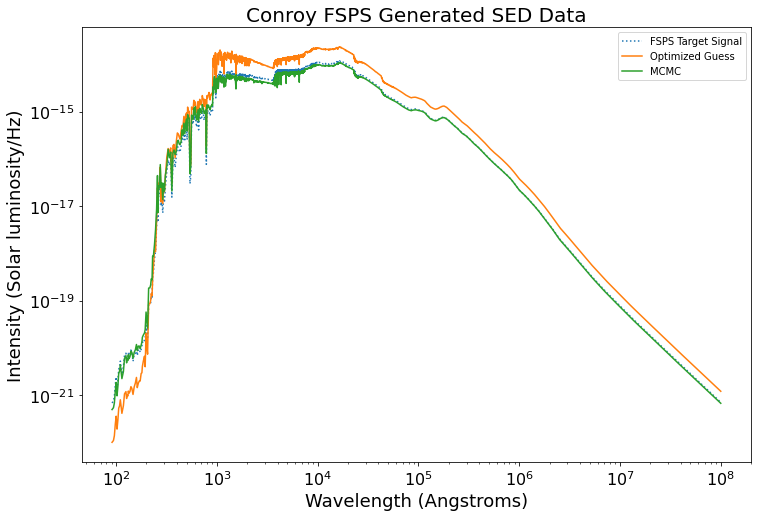

In [25]:
with Pool() as pool:
    perturbation = popt4 * 0.01
    no_of_Chain=500
    no_of_steps=5000

    text_label=[]

    for i in range(10):
        text_label.append('mass'+ str(i))

    lb   = np.zeros(10)
    ub   = np.full(10, 1e9)

    length_of_lb = len(lb)

    ndim, nwalkers = length_of_lb, no_of_Chain## Do the first MCMC operation.

    guesses = [popt4 + perturbation * np.random.randn(ndim) for i in range(nwalkers)]
    print("Starting emcee ***********")
    burntime = np.round(1000)
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, pool = pool, moves = emcee.moves.StretchMove(a = 2), args=(lb, ub, galactic_model_guess, wave, snorm4, enorm4))
    print("Start Burntime Calculations ***********")

    pos, prob, state = sampler.run_mcmc(guesses, burntime, progress = True)  #First Burning some steps
    sampler.reset()

    print("Done Burning Steps! Now starting the Final Calculations:")
    print("*****************")

    break_steps = 10000
    convergence_accuracy = 1e-5
    convergence_check = False
    
    sampler_1D, likelihood = initiate_walking(sampler, pos, no_of_steps, break_steps, convergence_accuracy, convergence_check, snorm4, enorm4, wave, galactic_model_guess)
    
    title = "Conroy FSPS Generated SED Data"
    galaxy = "FSPS Target Signal"

    best_fit4, exp_weight_array4 = print_and_plot_results(sampler_1D, wave, snorm4, title, galaxy, galactic_model_guess)

    print("Input values are (weight array): \n {}".format(test_weight_array4))
    
    plt.loglog(wave, spec_opt_guess4, label = "Optimized Guess")
    plt.loglog(wave, best_fit4, label = "MCMC")
    plt.legend()
    plt.show()

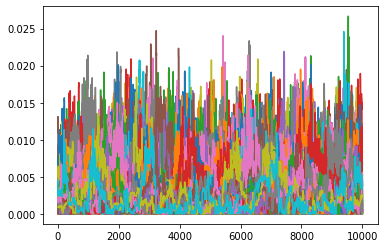

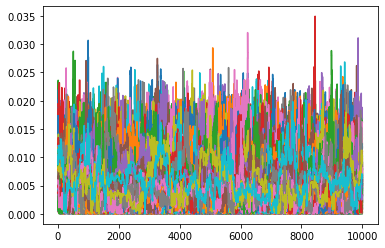

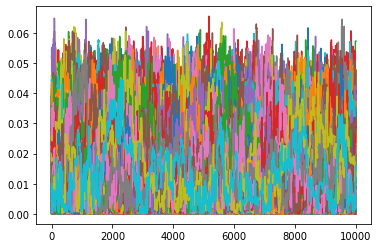

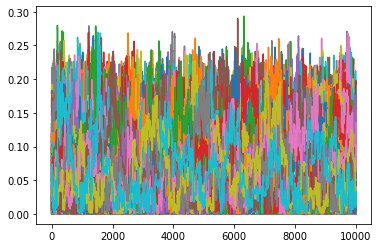

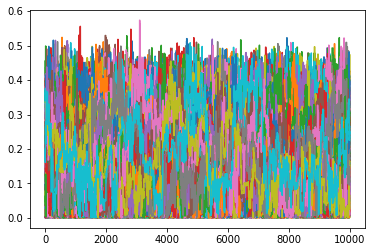

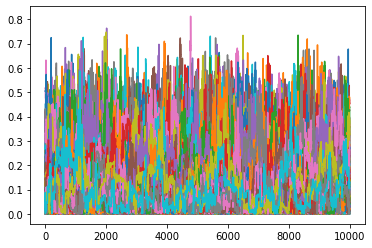

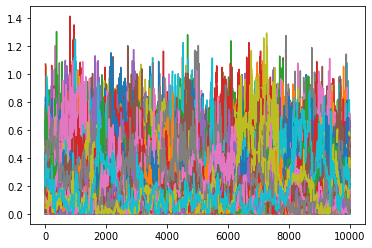

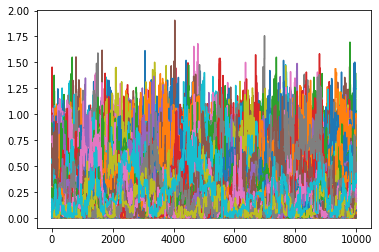

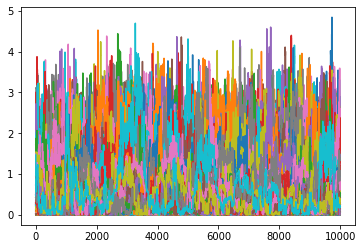

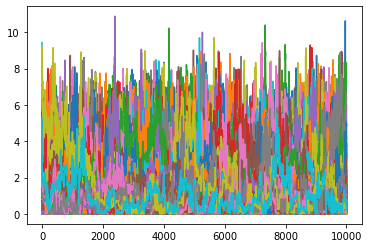

In [26]:
samples = sampler_1D.chain[:, :, :].reshape((-1, ndim))
sampler_ = np.array( sampler_1D.chain )

for this_dim in range(sampler_.shape[2]):   # number of parameters
    for walker_nr in range(sampler_.shape[0]):
        plt.step(range(sampler_.shape[1]), sampler_[walker_nr,:,this_dim])
    plt.show()

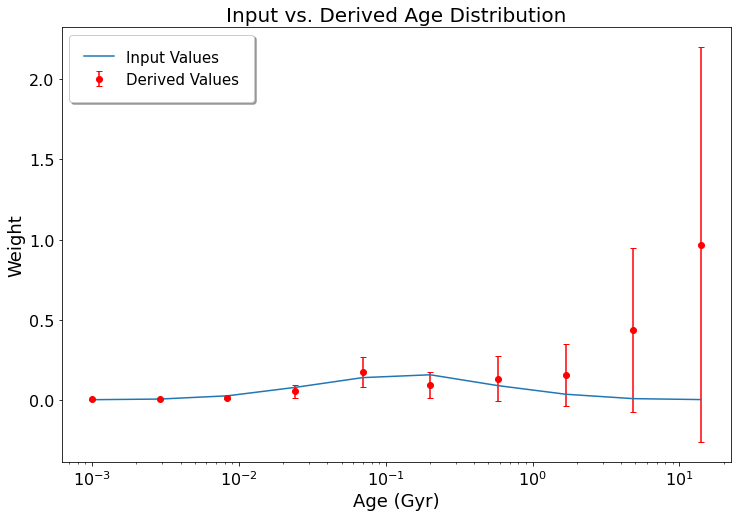

In [27]:
fig= plt.figure(figsize=(12,8))
y_unc = np.array(get_uncertainty(sampler_1D))
plt.errorbar(age_space, exp_weight_array4, yerr = y_unc, fmt = 'ro', ecolor = 'red', capsize = 3, ms = 6, label = "Derived Values")
#plt.errorbar(age_space, exp_weight_array4, yerr = y_unc_norm, fmt = 'bo', ecolor = 'blue', capsize = 3, ms = 6, label = "Normalized Derived Values")
plt.plot(age_space, test_weight_array4, 'tab:blue', label = "Input Values")
plt.xscale("log")
plt.title('Input vs. Derived Age Distribution', fontsize = 20)
plt.ylabel('Weight', fontsize = 18) # Labeling the x-axis
plt.xlabel('Age (Gyr)', fontsize = 18) # Labeling the y-axis
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1, prop={'size': 15})  
plt.savefig("gauss_distributions_1D_2.jpg")    
plt.show()

## Testing on Observable Data

In [9]:
ngc_337_rest_wave, ngc_337_flux, ngc_337_obs_wave, ngc_337_source = galsedatlas_read_spectral_data("SED Data Sets/ngc_337.dat")
ngc_4486_rest_wave, ngc_4486_flux, ngc_4486_obs_wave, ngc_4486_source = galsedatlas_read_spectral_data("SED Data Sets/ngc_4486.dat")
ngc_4594_rest_wave, ngc_4594_flux, ngc_4594_obs_wave, ngc_4594_source = galsedatlas_read_spectral_data("SED Data Sets/ngc_4594.dat")
ngc_4826_rest_wave, ngc_4826_flux, ngc_4826_obs_wave, ngc_4826_source = galsedatlas_read_spectral_data("SED Data Sets/ngc_4826.dat")
ngc_4486_flux_err  = 1e-24 * np.ones(len(ngc_4486_flux))

In [10]:
metallicity_space = np.array([-3, 0, 1])
age_space = np.logspace(-3, 1.146, 10)

Current Starting Position
[0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01]
Optimizing Guess ***********


/apps/jupyterhub/1.1.0/lib/python3.8/site-packages/scipy/optimize/_numdiff.py:557: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/apps/jupyterhub/1.1.0/lib/python3.8/site-packages/scipy/optimize/_numdiff.py:557: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/apps/jupyterhub/1.1.0/lib/python3.8/site-packages/scipy/optimize/_numdiff.py:557: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/apps/jupyterhub/1.1.0/lib/python3.8/site-packages/scipy/optimize/_numdiff.py:557: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


[0.23683031 0.26240638 0.00548278 0.06841913 0.04084744 0.03048704
 0.02898212 0.0235725  0.01442296 0.01150347 0.30016766 0.38877875
 0.49334946 0.04178852 0.08670539 0.08539866 0.0497331  0.02609188
 0.01291972 0.01007329 0.35929796 0.45574046 0.45767462 0.03195708
 0.09962617 0.11628006 0.09477313 0.03751385 0.02062383 0.01005104]


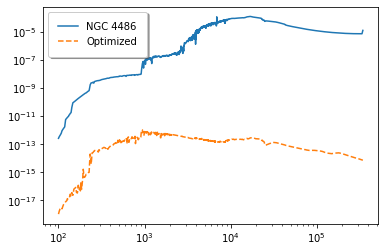

In [11]:
lb   = np.zeros(30)
ub   = np.full(30, 1e15)

starting_weight_array = np.zeros(30) + 0.01

print("Current Starting Position")
print(starting_weight_array)
print('Optimizing Guess ***********')

popt = optimize_guess(galactic_model_guess, starting_weight_array, lb, ub, ngc_4486_rest_wave, ngc_4486_flux, ngc_4486_flux_err)
print(popt)

ngc_4486_opt_guess= galactic_model_guess(popt, ngc_4486_rest_wave)

plt.loglog(ngc_4486_rest_wave, ngc_4486_flux, label='NGC 4486')
plt.loglog(ngc_4486_rest_wave, ngc_4486_opt_guess, ls='--', label='Optimized')
plt.legend(fancybox=True, framealpha=1, shadow=True, borderpad=1, prop={'size': 10})
plt.show()

Steps Taken:  15000 Likelihood:  -458.12684477456503


<ipython-input-2-9790491ea630>:236: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  samples=sampler.chain[:, np.rint(no_of_steps/5).astype(np.int):, :].reshape((-1, ndim))#sampler.flatchain


Derived values are (weight array): 
 [6.49077661e+04 8.61099700e+04 9.16891133e+05 5.08710100e+07
 1.25927792e+07 1.06410561e+06 1.09853989e+07 3.73729283e+06
 4.66023210e+06 3.08500873e+06 1.63327755e+05 1.60749946e+05
 1.86161341e+08 5.14877237e+06 7.07514637e+06 6.76060048e+07
 1.32056359e+07 4.44249628e+06 2.89148673e+05 3.26577336e+05
 1.54051028e+05 2.89853827e+05 1.08765787e+08 2.42508510e+06
 7.42238147e+07 5.25940019e+06 1.80554231e+06 2.50081557e+07
 3.53508800e+06 7.73099076e+05]


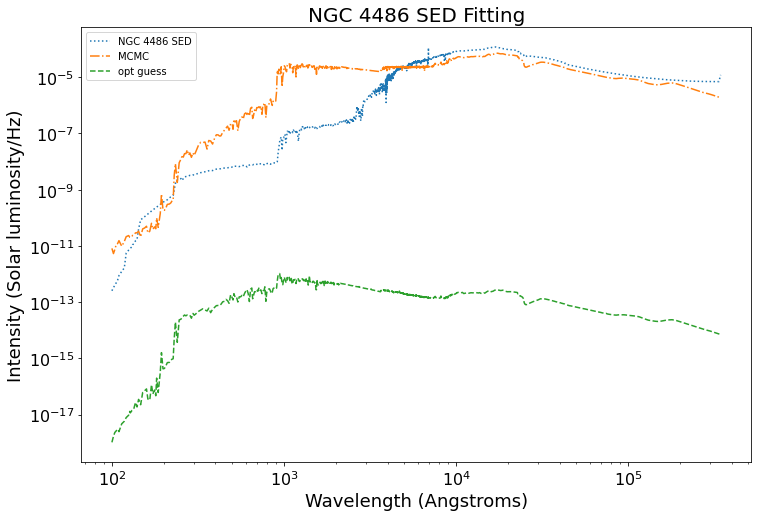

In [12]:
with Pool() as pool:
    perturbation = popt * 0.10
    no_of_Chain=500
    no_of_steps=5000

    text_label=[]

    for i in range(30):
        text_label.append('mass'+ str(i))

    lb   = np.zeros(30)
    ub   = np.full(30, 1e12)

    length_of_lb = len(lb)

    ndim, nwalkers = length_of_lb, no_of_Chain## Do the first MCMC operation.

    guesses = [popt + perturbation * np.random.randn(ndim) for i in range(nwalkers)]
    print("Starting emcee ***********")
    burntime = np.round(5000)
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, pool = pool, moves = emcee.moves.StretchMove(a = 10), args=(lb, ub, galactic_model_guess, ngc_4486_rest_wave, ngc_4486_flux, ngc_4486_flux_err))
    print("Start Burntime Calculations ***********")

    pos, prob, state = sampler.run_mcmc(guesses, burntime, progress = True)  #First Burning some steps
    sampler.reset()

    print("Done Burning Steps! Now starting the Final Calculations:")
    print("*****************")

    break_steps = 15000
    convergence_accuracy = 1e-4
    convergence_check = False
    
    sampler1, likelihood = initiate_walking(sampler, pos, no_of_steps, break_steps, convergence_accuracy, convergence_check, ngc_4486_flux, ngc_4486_flux_err, ngc_4486_rest_wave, galactic_model_guess)

    title = "NGC 4486 SED Fitting"
    galaxy = "NGC 4486 SED"
    
    best_fit1, exp_weight_array1 = print_and_plot_results(sampler, ngc_4486_rest_wave, ngc_4486_flux, title, galaxy, galactic_model_guess)
    
    plt.loglog(ngc_4486_rest_wave, best_fit1, label = "MCMC", ls = '-.')
    plt.loglog(ngc_4486_rest_wave,ngc_4486_opt_guess,label='opt guess', ls='--')
    plt.legend()
    plt.savefig("ngc_4486_log.jpg")
    plt.show()

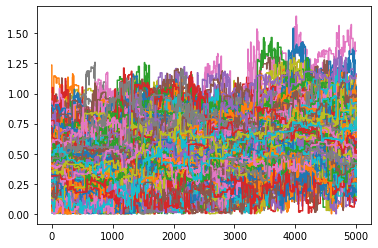

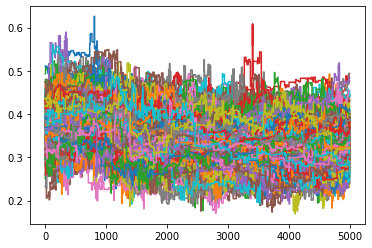

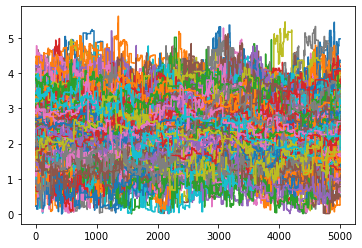

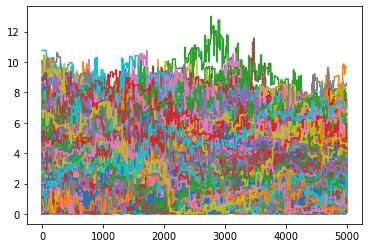

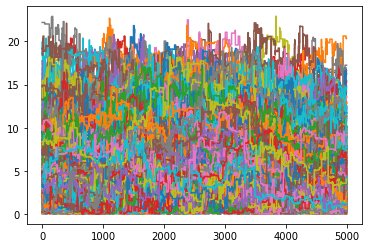

...

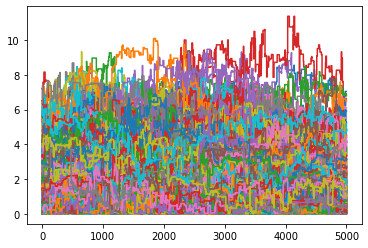

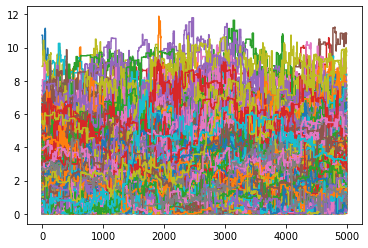

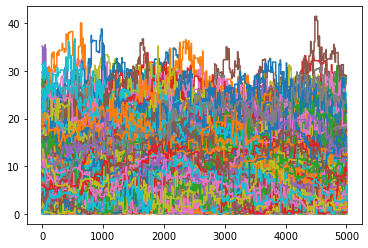

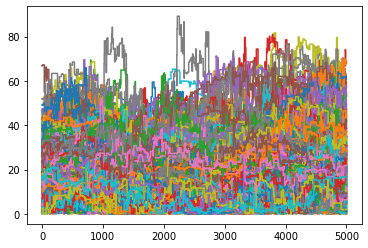

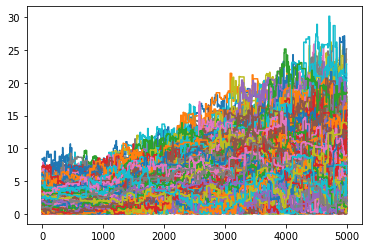

In [33]:
samples = sampler.chain[:, :, :].reshape((-1, ndim))
sampler_ = np.array( sampler.chain )

for this_dim in range(sampler_.shape[2]):   # number of parameters
    for walker_nr in range(sampler_.shape[0]):
        plt.step(range(sampler_.shape[1]), sampler_[walker_nr,:,this_dim])
    plt.show()